# Applying CEBRA to Data taken from JHU Dome Data

In [1]:
import sys
import os
import importlib
sys.path.append("/Users/devenshidfar/Desktop/Masters/NRSC_510B/cebra_control_recal")
sys.path.append("/Users/devenshidfar/Desktop/Masters/NRSC_510B/cebra_control_recal/shared_scripts")
import numpy as np
import scipy.io
import cebra
from scipy import stats
import matplotlib.pyplot as plt
import sys
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation
import seaborn as sns; sns.set()
import timeit
from scipy.interpolate import splprep, splev
import manifold_fit_and_decode_fns as mff
import fit_helper_fns as fhf
import cebra_utils
from cebra_utils import *
importlib.reload(cebra_utils)
from scipy.interpolate import interp1d
import pandas as pd
import umap.umap_ as umap
from sklearn.manifold import TSNE


## Load the data

In [2]:
# Load data
file_path = '/Users/devenshidfar/Desktop/Masters/control_recal/data_control_recal/dataverse_files/data/NN_opticflow_dataset.mat'
data = scipy.io.loadmat(file_path, squeeze_me=True, struct_as_record=False)
expt = data['expt']

print(expt.shape)

print(f"Experiment data type: {expt.dtype}")
print(f"Experiment data shape: {expt.shape}")

FileNotFoundError: [Errno 2] No such file or directory: '/Users/devenshidfar/Desktop/Masters/control_recal/data_control_recal/dataverse_files/data/NN_opticflow_dataset.mat'

## Collect Data and compile into CEBRA compatible format

bin_size: 1
Skipping session 1
Skipping session 2
Skipping session 3
Skipping session 4
Skipping session 5
Skipping session 6
Skipping session 7
Skipping session 8
Skipping session 9
Skipping session 10
Skipping session 11
Skipping session 12
Skipping session 13
Skipping session 14
Skipping session 15
Skipping session 16
Skipping session 17
Skipping session 18
Skipping session 19
Skipping session 20
Skipping session 21
Skipping session 22
Skipping session 23
Skipping session 24
Skipping session 25
Skipping session 26
Skipping session 27
Skipping session 28
Skipping session 29
Skipping session 30
Skipping session 31
Skipping session 32
Skipping session 33
Skipping session 34
Skipping session 35
Skipping session 36
Skipping session 37
Skipping session 38
Skipping session 39
Processing session 40/65
Rat: 913, Day: 7, Epoch: m1
length of experiment in seconds 209.6402246
length of experiment in minutes 3.4940037433333333
Processing cluster: TT11/cl-maze1.2
Number of spikes: 60
Binned spike

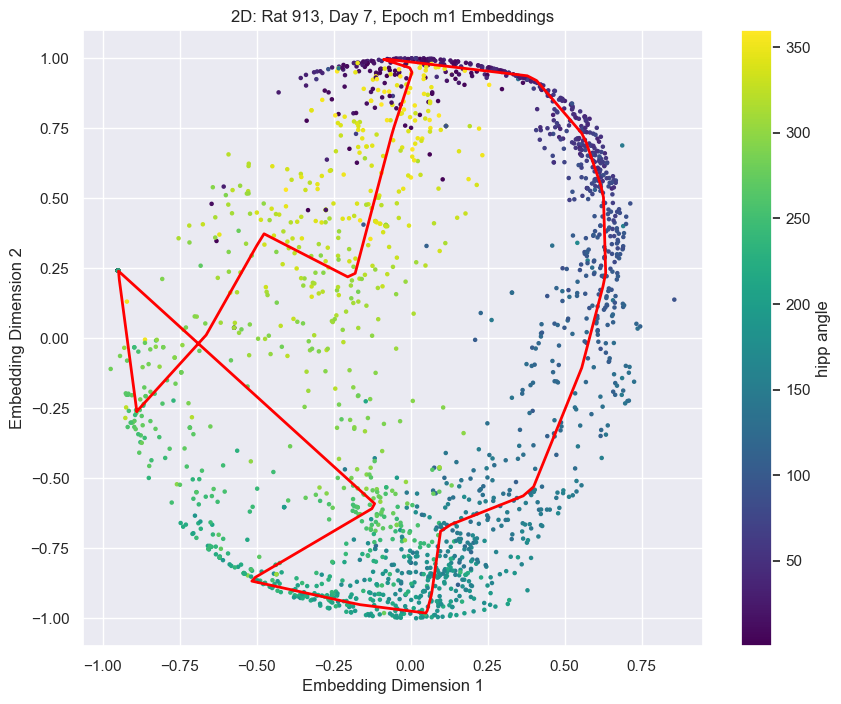

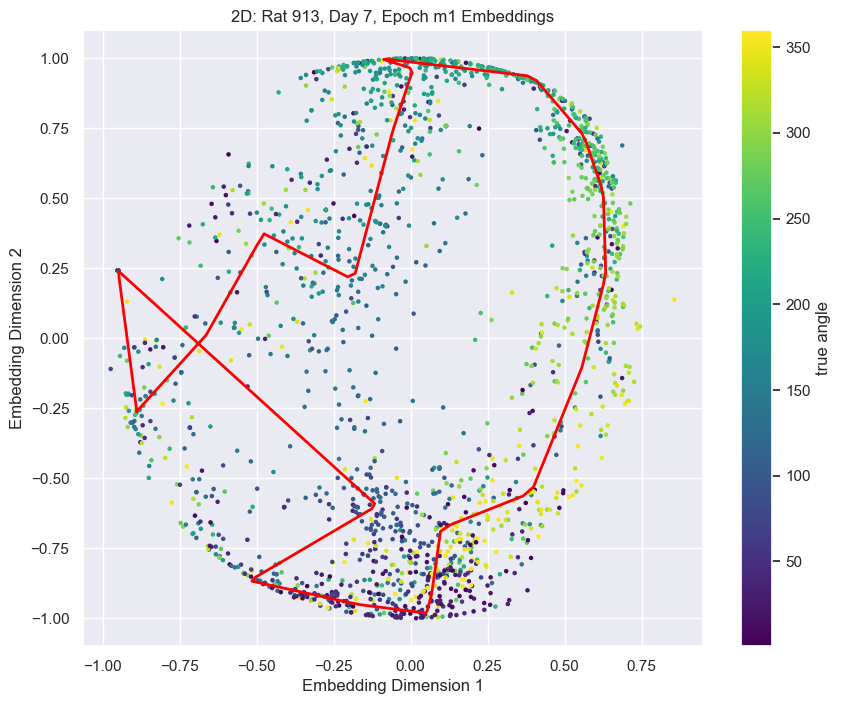

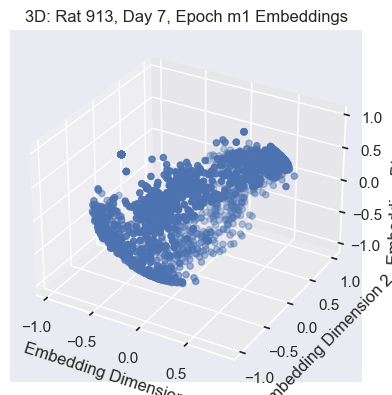

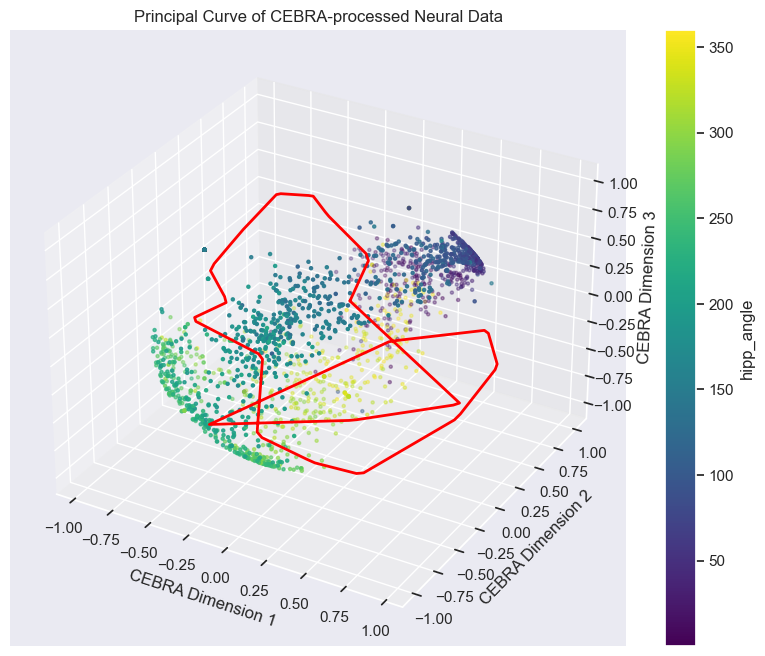

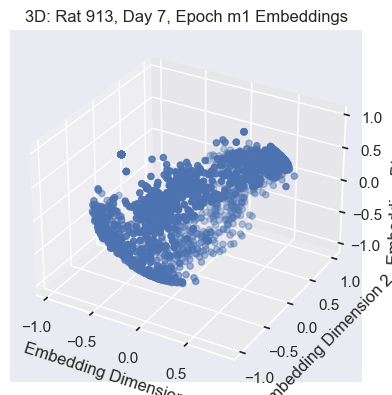

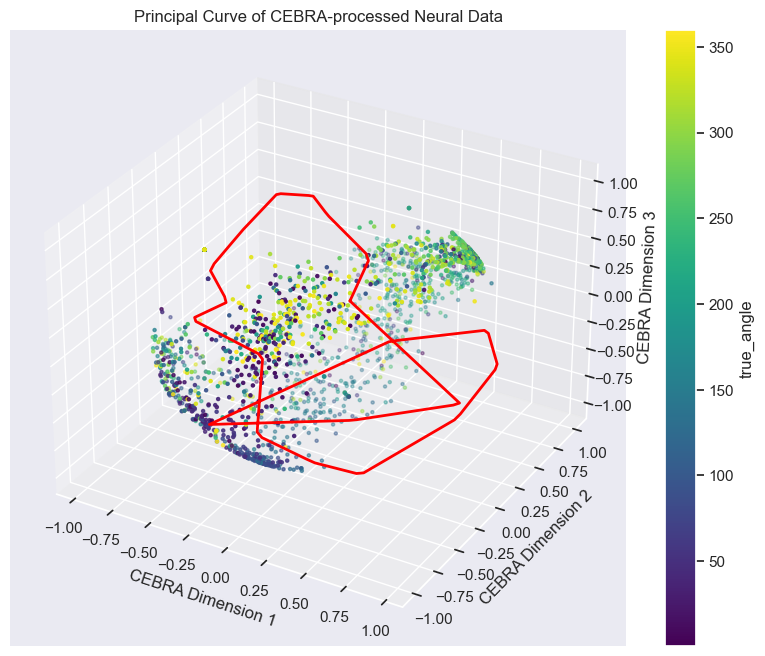

4
Computing UMAP embeddings...


/opt/anaconda3/envs/NRSC510/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


UMAP embeddings shape: (2096, 2)
Saved embedding plots to /Users/devenshidfar/Desktop/Masters/NRSC_510B/cebra_control_recal/results/session_40_embeddings.png


/var/folders/j3/sgby32516rl80nxb7vn4p93w0000gn/T/ipykernel_66608/388227147.py:232: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(tsne_embeddings[:, 0], tsne_embeddings[:, 1], s=10, cmap='viridis')


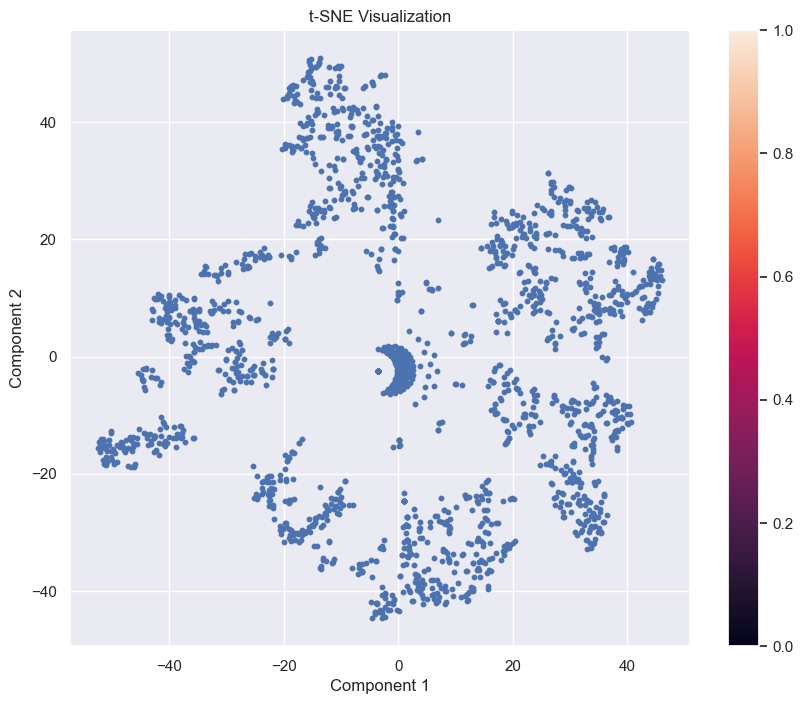

Saved embeddings metadata to /Users/devenshidfar/Desktop/Masters/NRSC_510B/cebra_control_recal/results/embeddings_metadata.csv
Processing session 41/65
Rat: 913, Day: 9, Epoch: m1
length of experiment in seconds 218.0369175
length of experiment in minutes 3.633948625
Skipping cluster TT1/cl-maze1.1 due to low isolation quality (4)
Skipping cluster TT11/cl-maze1.11 due to low isolation quality (4)
Skipping cluster TT11/cl-maze1.2 due to low isolation quality (4)
Skipping cluster TT11/cl-maze1.3 due to low isolation quality (4)
Processing cluster: TT11/cl-maze1.4
Number of spikes: 302
Binned spikes shape: (2180,)
Processing cluster: TT11/cl-maze1.6
Number of spikes: 612
Binned spikes shape: (2180,)
Skipping cluster TT11/cl-maze1.7 due to low isolation quality (4)
Skipping cluster TT11/cl-maze1.9 due to low isolation quality (4)
Skipping cluster TT12/cl-maze1.1 due to low isolation quality (4)
Processing cluster: TT14/cl-maze1.1
Number of spikes: 18789
Binned spikes shape: (2180,)
Process

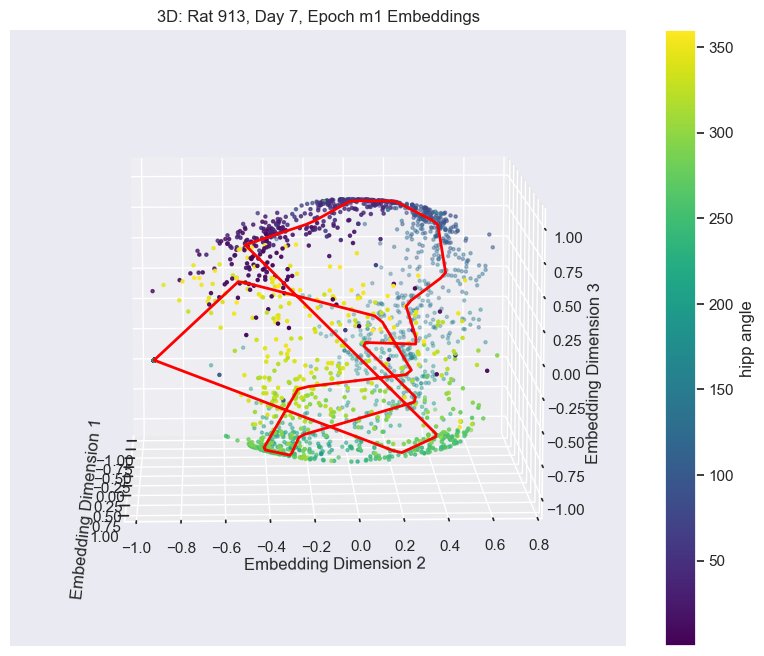

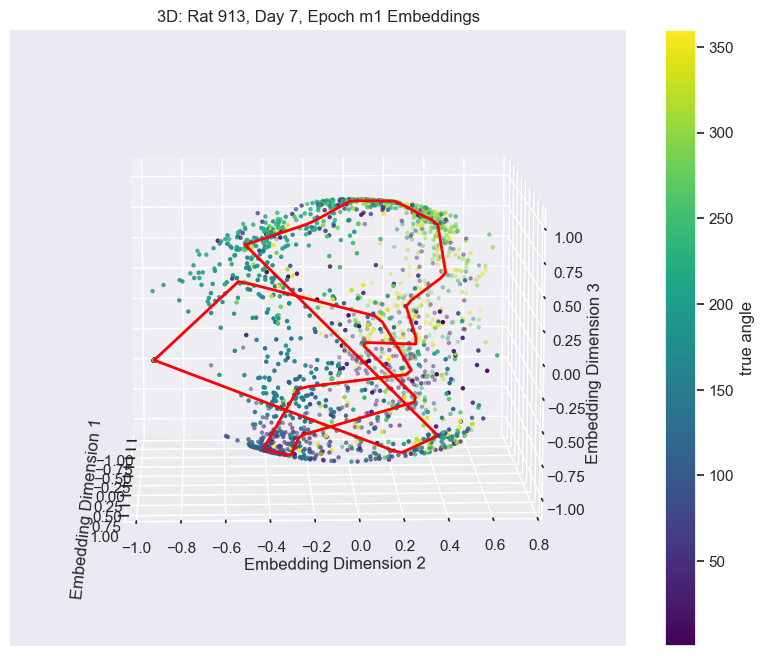

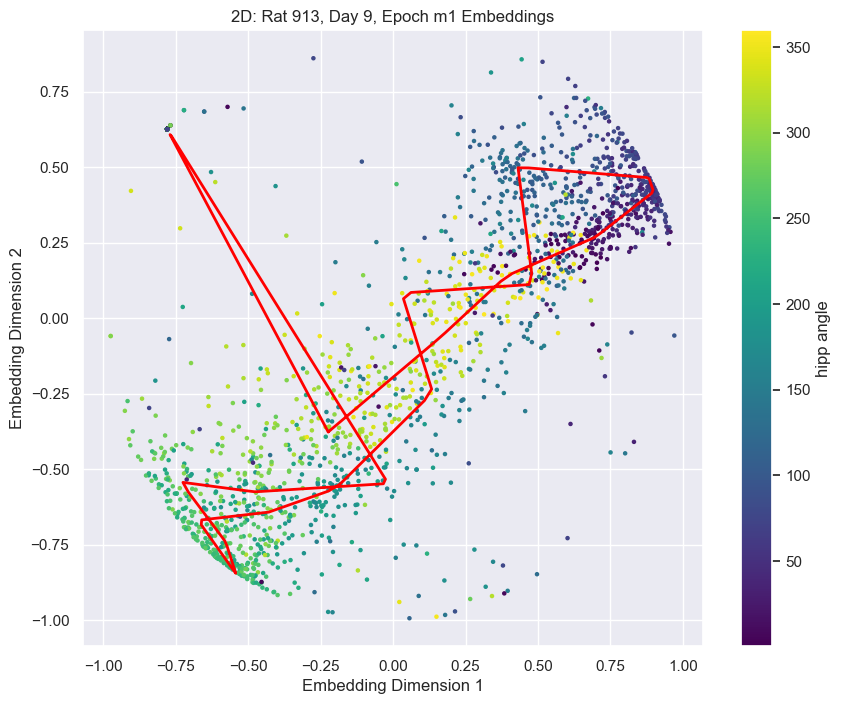

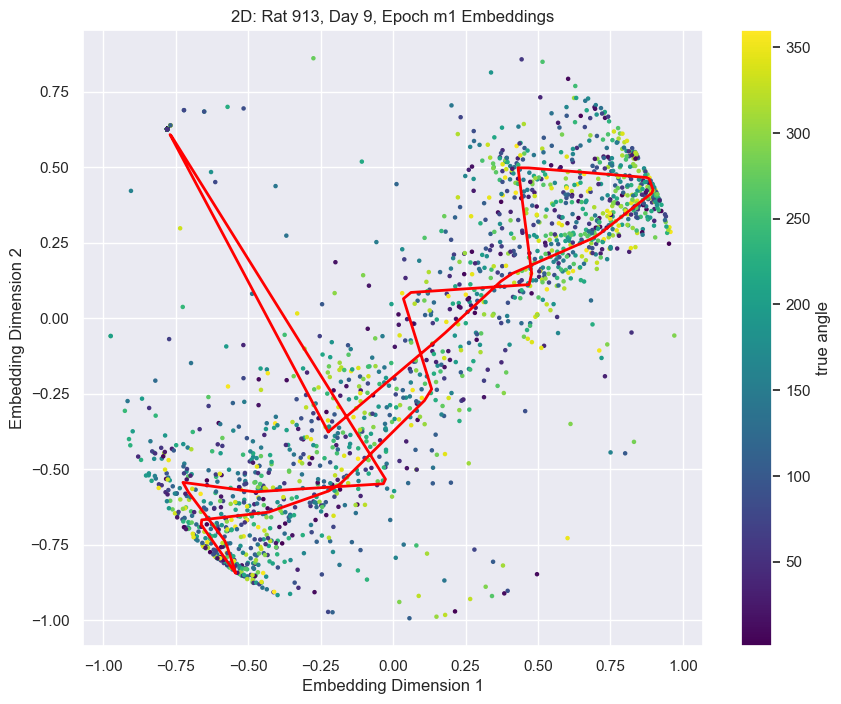

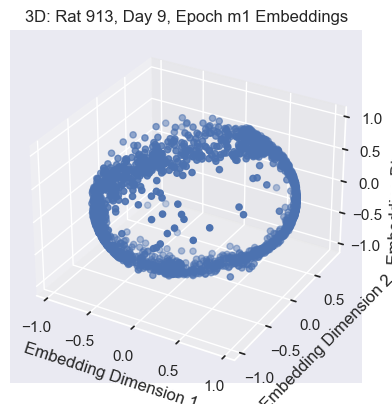

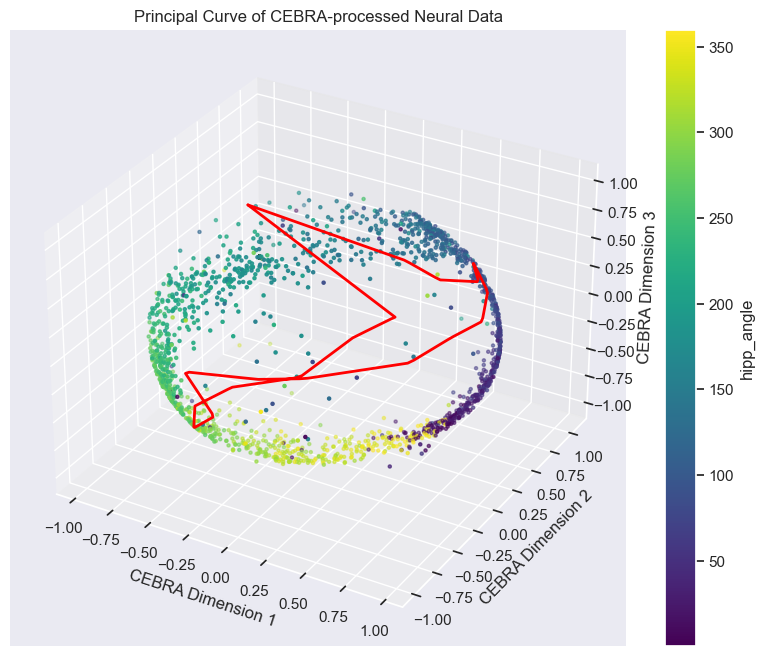

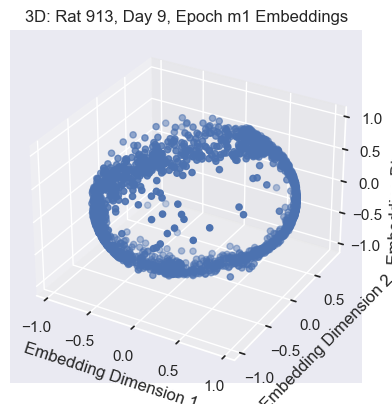

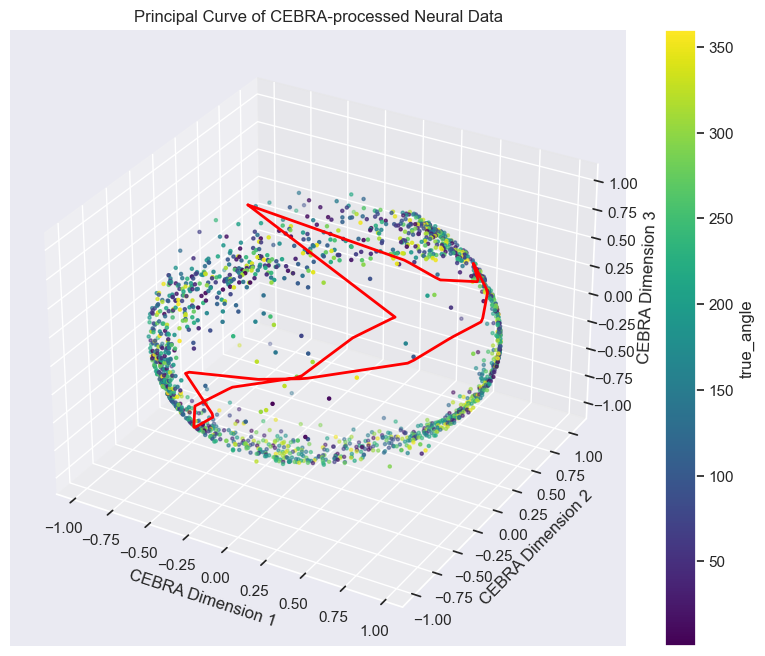

4
Computing UMAP embeddings...


/opt/anaconda3/envs/NRSC510/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


UMAP embeddings shape: (2180, 2)
Saved embedding plots to /Users/devenshidfar/Desktop/Masters/NRSC_510B/cebra_control_recal/results/session_41_embeddings.png


/var/folders/j3/sgby32516rl80nxb7vn4p93w0000gn/T/ipykernel_66608/388227147.py:232: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(tsne_embeddings[:, 0], tsne_embeddings[:, 1], s=10, cmap='viridis')


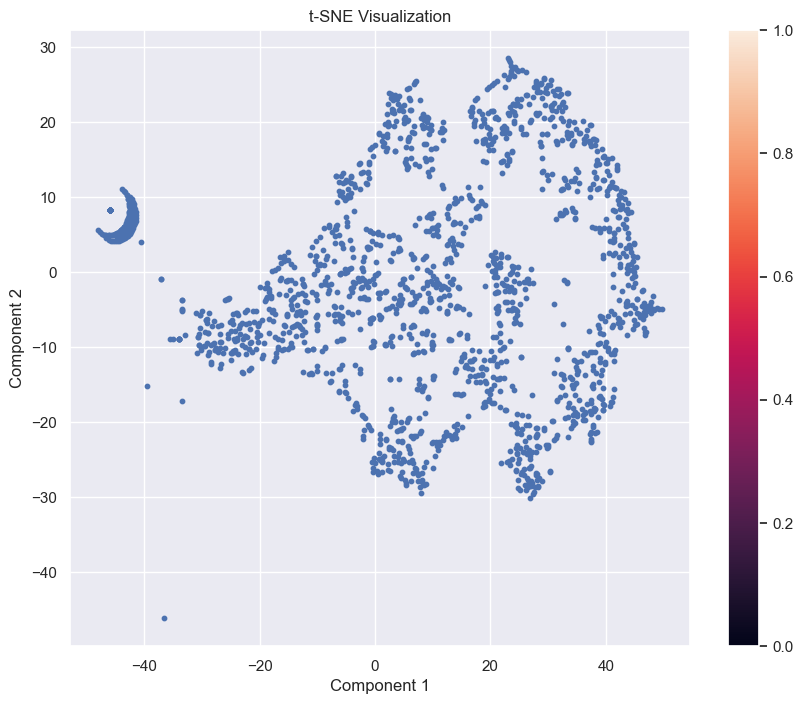

Saved embeddings metadata to /Users/devenshidfar/Desktop/Masters/NRSC_510B/cebra_control_recal/results/embeddings_metadata.csv
Processing session 42/65
Rat: 913, Day: 10, Epoch: m1
length of experiment in seconds 258.1596494
length of experiment in minutes 4.302660823333333
Skipping cluster TT1/cl-maze1.2 due to low isolation quality (4)
Processing cluster: TT1/cl-maze1.3
Number of spikes: 480
Binned spikes shape: (2581,)
Processing cluster: TT11/cl-maze1.2
Number of spikes: 54
Binned spikes shape: (2581,)
Processing cluster: TT11/cl-maze1.4
Number of spikes: 1036
Binned spikes shape: (2581,)
Skipping cluster TT11/cl-maze1.5 due to low isolation quality (4)
Processing cluster: TT11/cl-maze1.6
Number of spikes: 1526
Binned spikes shape: (2581,)
Skipping cluster TT11/cl-maze1.8 due to low isolation quality (4)
Processing cluster: TT14/cl-maze1.1
Number of spikes: 22504
Binned spikes shape: (2581,)
Skipping cluster TT14/cl-maze1.11 due to low isolation quality (4)
Skipping cluster TT14/cl

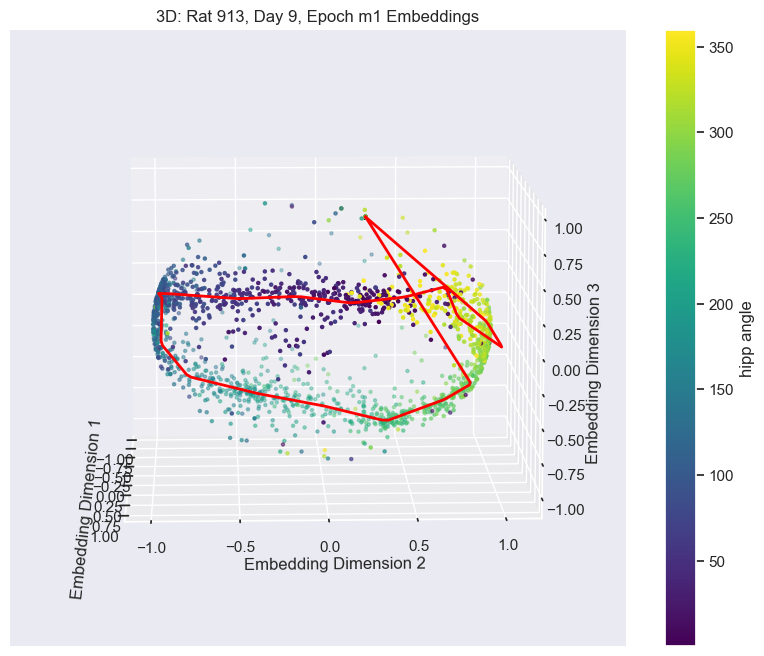

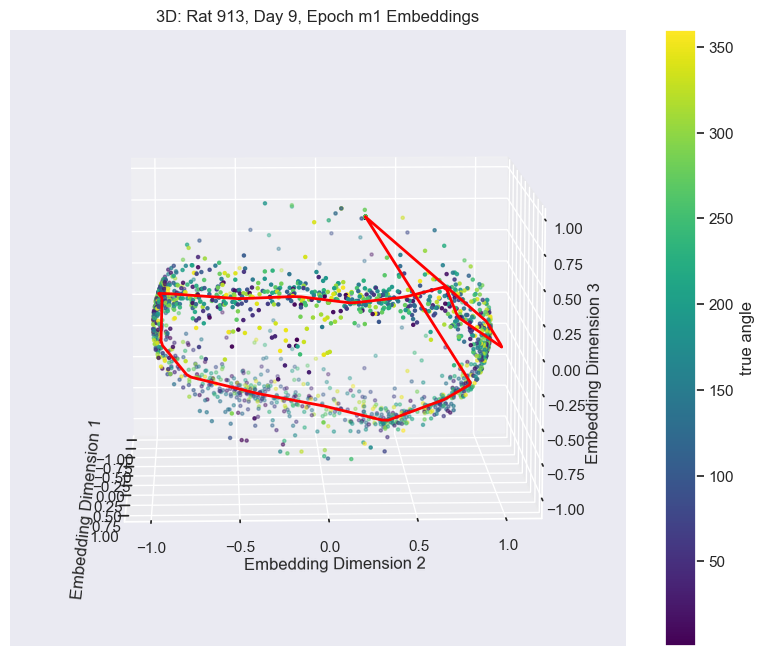

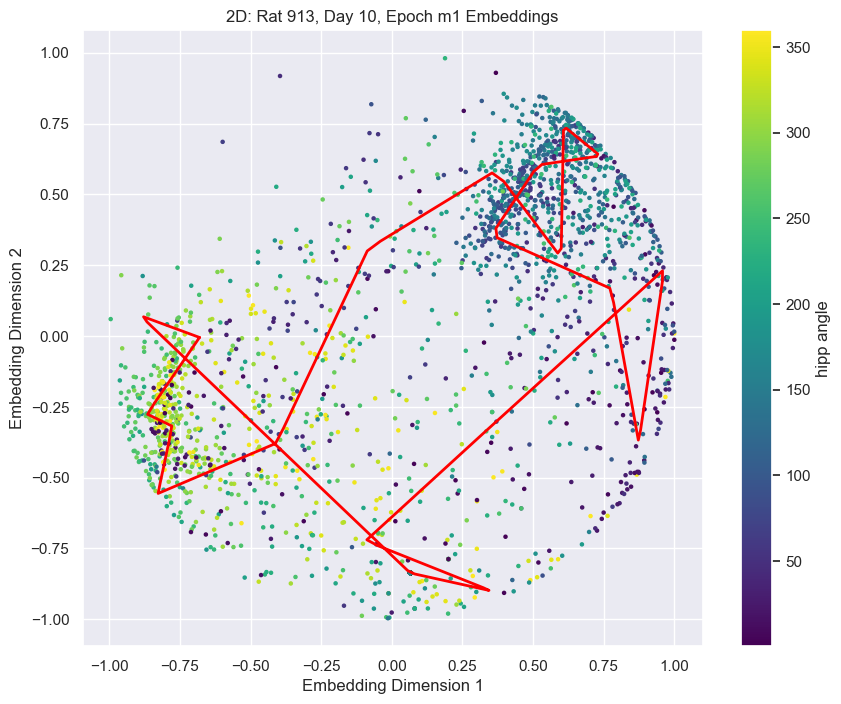

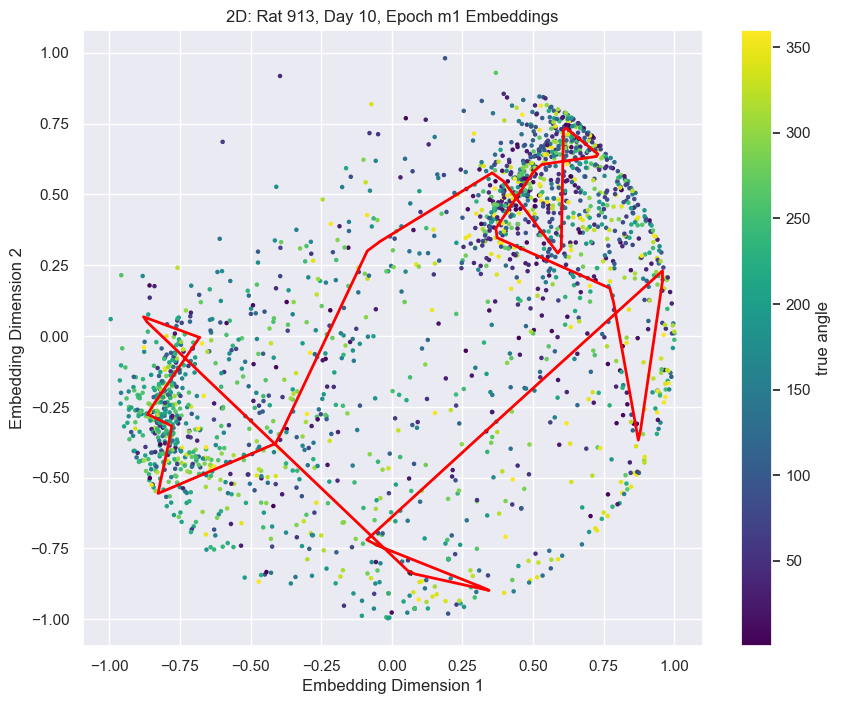

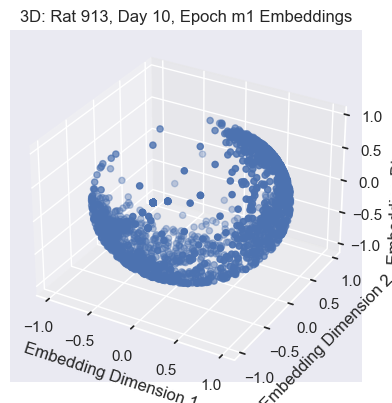

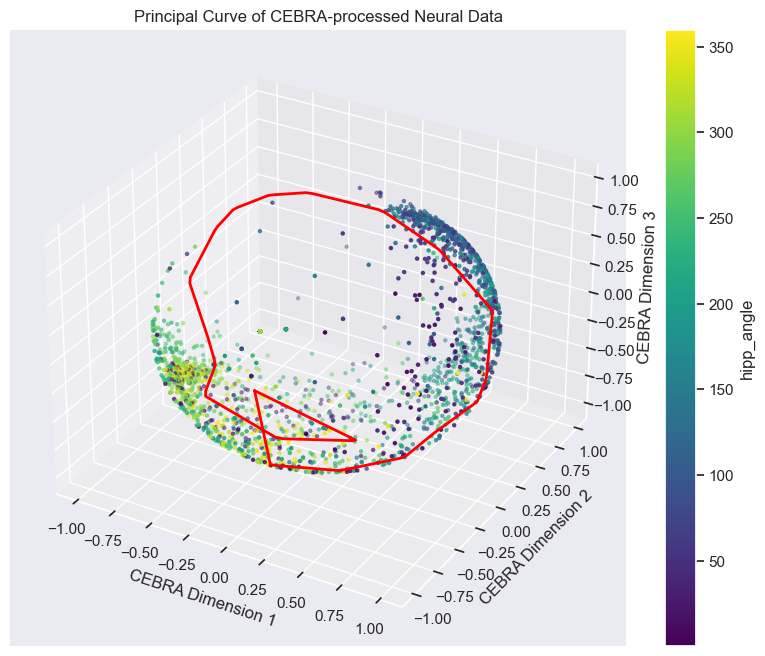

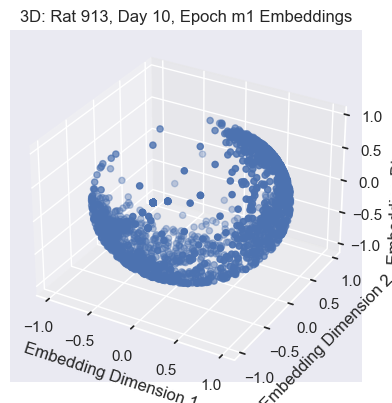

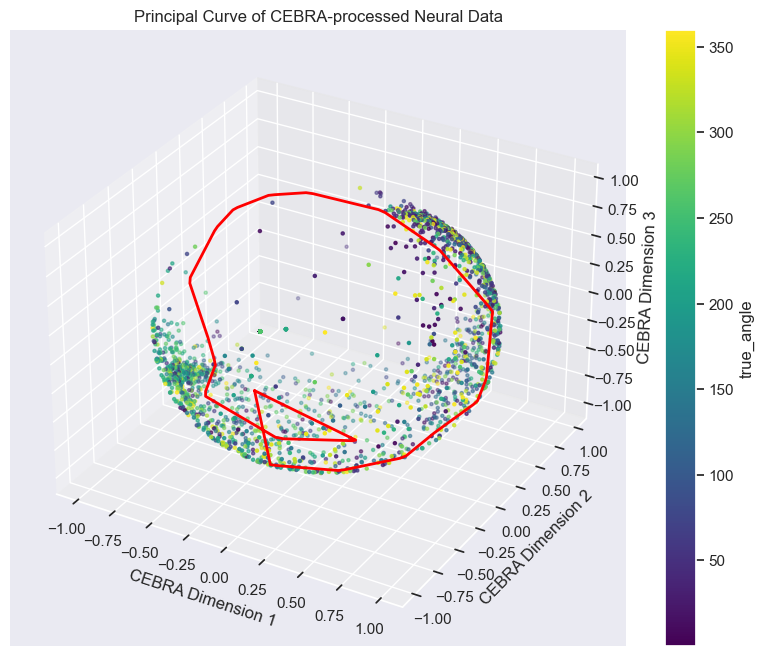

4
Computing UMAP embeddings...


/opt/anaconda3/envs/NRSC510/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


UMAP embeddings shape: (2581, 2)
Saved embedding plots to /Users/devenshidfar/Desktop/Masters/NRSC_510B/cebra_control_recal/results/session_42_embeddings.png


/var/folders/j3/sgby32516rl80nxb7vn4p93w0000gn/T/ipykernel_66608/388227147.py:232: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(tsne_embeddings[:, 0], tsne_embeddings[:, 1], s=10, cmap='viridis')


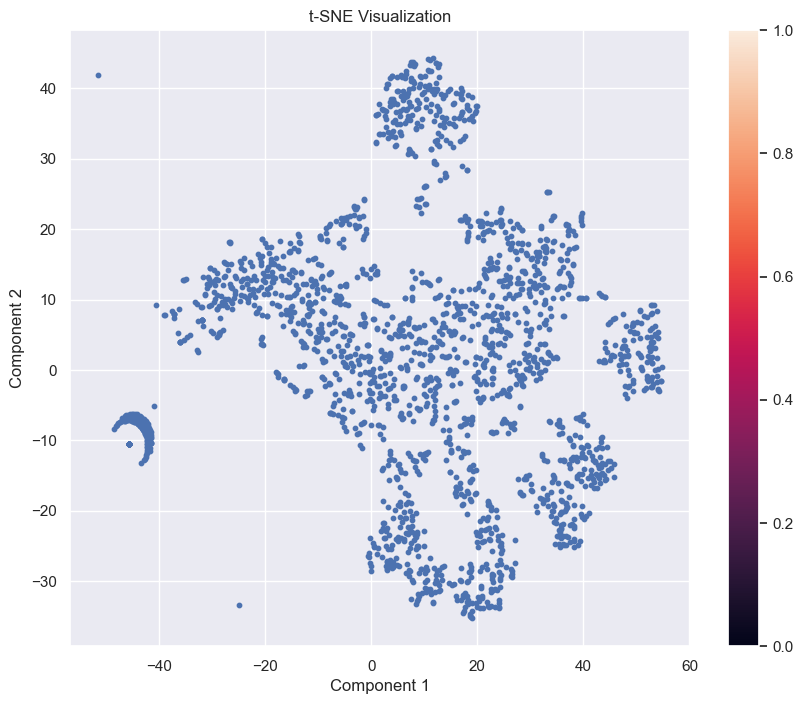

Saved embeddings metadata to /Users/devenshidfar/Desktop/Masters/NRSC_510B/cebra_control_recal/results/embeddings_metadata.csv
Processing session 43/65
Rat: 913, Day: 11, Epoch: m1
length of experiment in seconds 159.8986015
length of experiment in minutes 2.664976691666667
Processing cluster: TT1/cl-maze1.1
Number of spikes: 697
Binned spikes shape: (1598,)
Skipping cluster TT1/cl-maze1.2 due to low isolation quality (4)
Skipping cluster TT11/cl-maze1.10 due to low isolation quality (4)
Processing cluster: TT11/cl-maze1.2
Number of spikes: 750
Binned spikes shape: (1598,)
Processing cluster: TT11/cl-maze1.4
Number of spikes: 276
Binned spikes shape: (1598,)
Skipping cluster TT11/cl-maze1.5 due to low isolation quality (4)
Processing cluster: TT11/cl-maze1.6
Number of spikes: 1147
Binned spikes shape: (1598,)
Processing cluster: TT11/cl-maze1.7
Number of spikes: 291
Binned spikes shape: (1598,)
Skipping cluster TT11/cl-maze1.9 due to low isolation quality (4)
Processing cluster: TT12/c

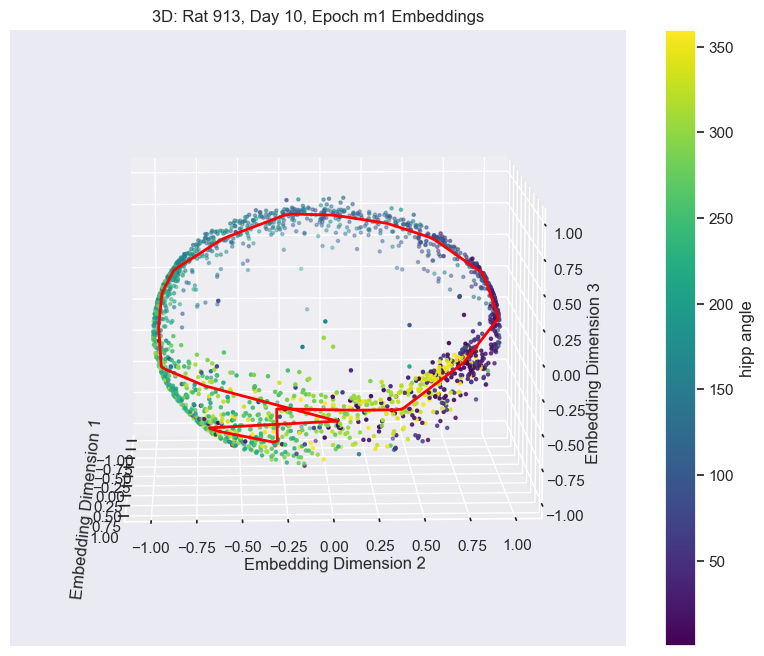

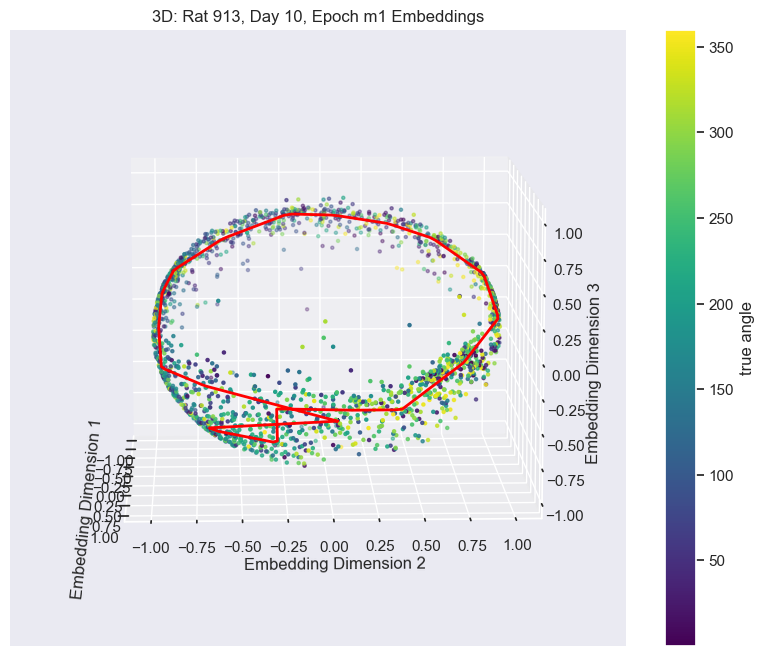

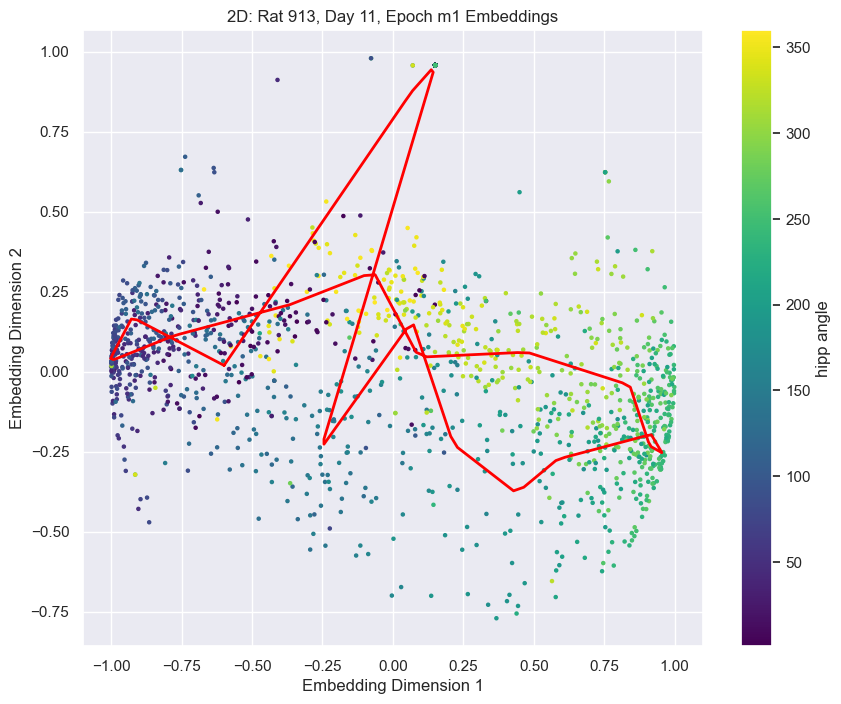

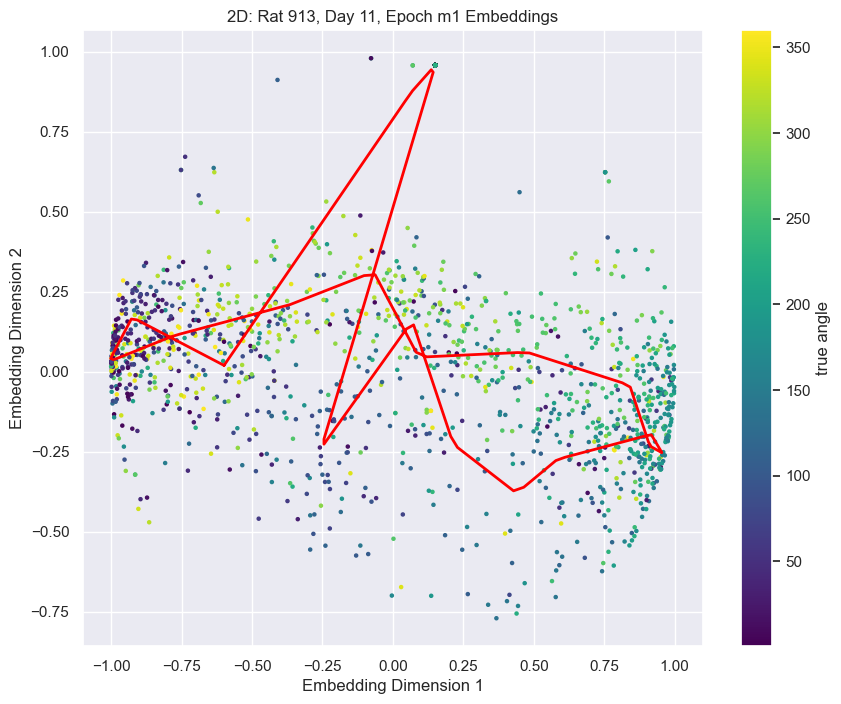

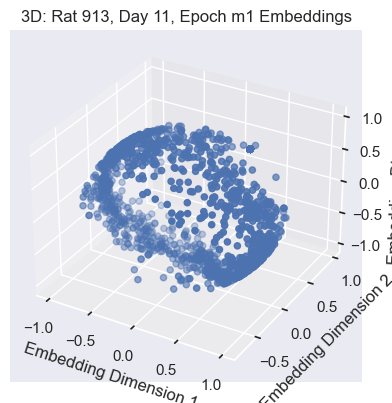

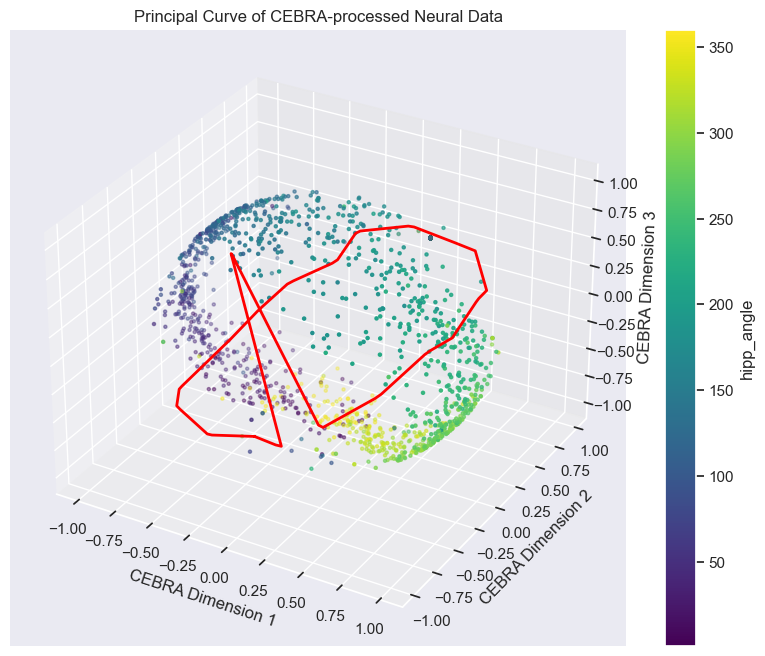

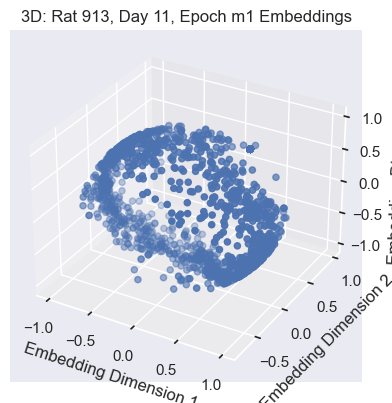

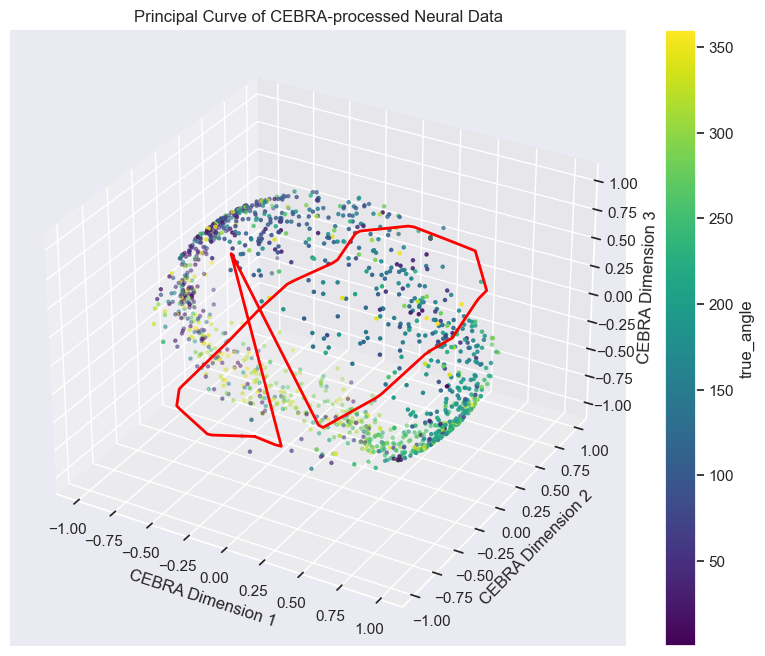

4
Computing UMAP embeddings...


/opt/anaconda3/envs/NRSC510/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


UMAP embeddings shape: (1598, 2)
Saved embedding plots to /Users/devenshidfar/Desktop/Masters/NRSC_510B/cebra_control_recal/results/session_43_embeddings.png


/var/folders/j3/sgby32516rl80nxb7vn4p93w0000gn/T/ipykernel_66608/388227147.py:232: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(tsne_embeddings[:, 0], tsne_embeddings[:, 1], s=10, cmap='viridis')


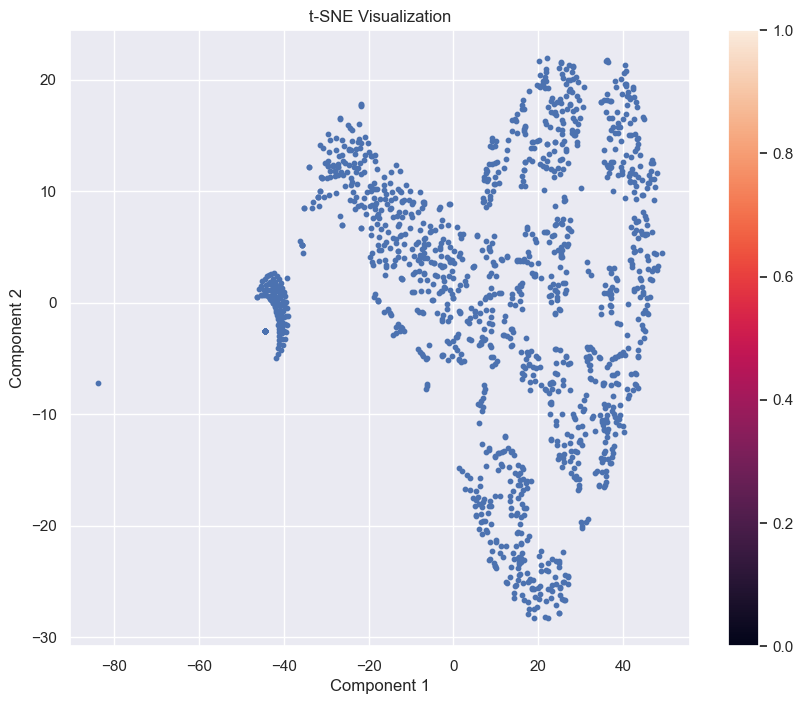

Saved embeddings metadata to /Users/devenshidfar/Desktop/Masters/NRSC_510B/cebra_control_recal/results/embeddings_metadata.csv
Processing session 44/65
Rat: 913, Day: 12, Epoch: m1
length of experiment in seconds 155.7802291
length of experiment in minutes 2.5963371516666665
Processing cluster: TT1/cl-maze1.3
Number of spikes: 485
Binned spikes shape: (1557,)
Processing cluster: TT1/cl-maze1.4
Number of spikes: 638
Binned spikes shape: (1557,)
Processing cluster: TT1/cl-maze1.5
Number of spikes: 2946
Binned spikes shape: (1557,)
Skipping cluster TT1/cl-maze1.6 due to low isolation quality (4)
Processing cluster: TT11/cl-maze1.2
Number of spikes: 60
Binned spikes shape: (1557,)
Processing cluster: TT11/cl-maze1.4
Number of spikes: 85
Binned spikes shape: (1557,)
Processing cluster: TT11/cl-maze1.5
Number of spikes: 103
Binned spikes shape: (1557,)
Processing cluster: TT11/cl-maze1.6
Number of spikes: 219
Binned spikes shape: (1557,)
Processing cluster: TT11/cl-maze1.7
Number of spikes: 

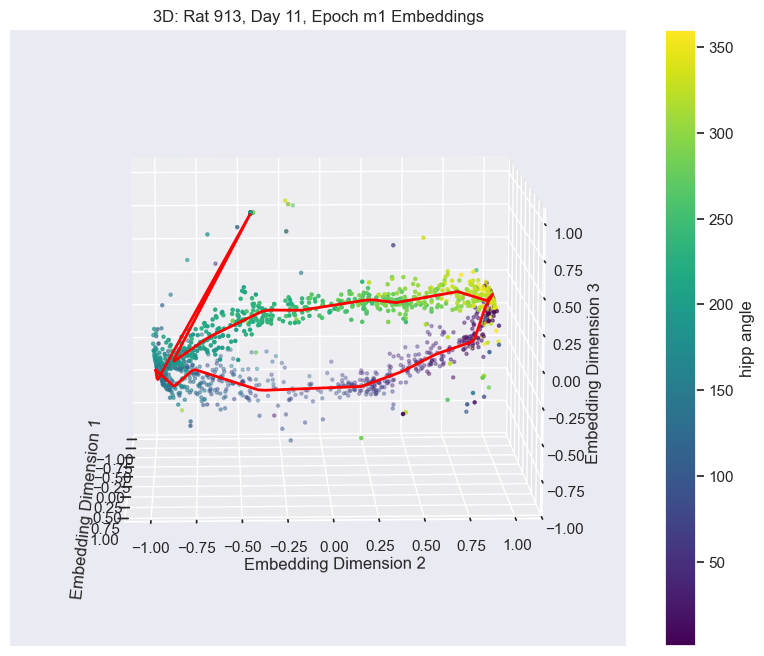

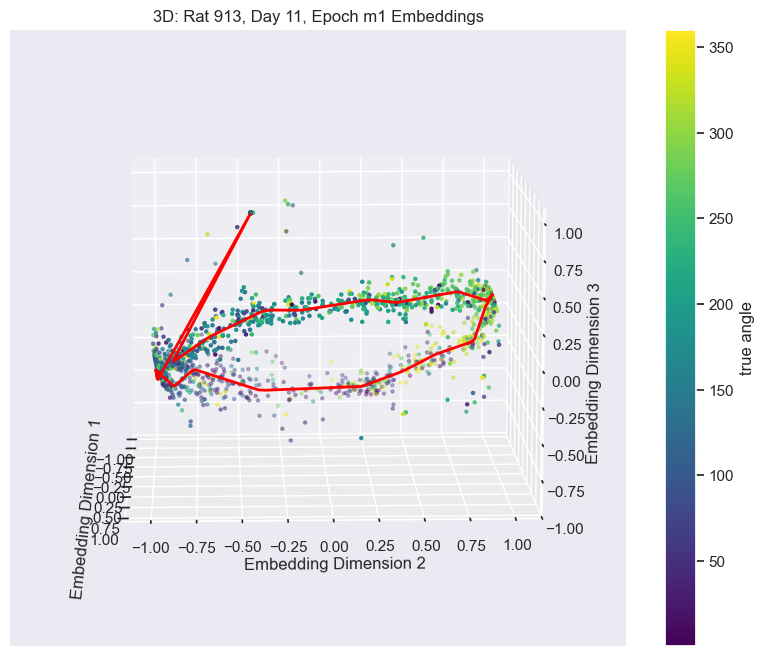

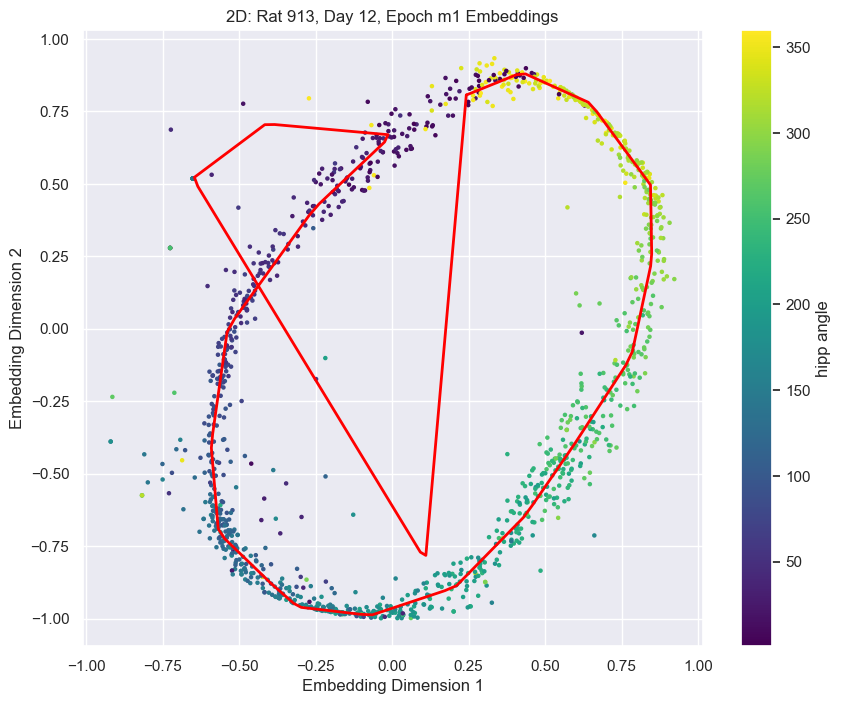

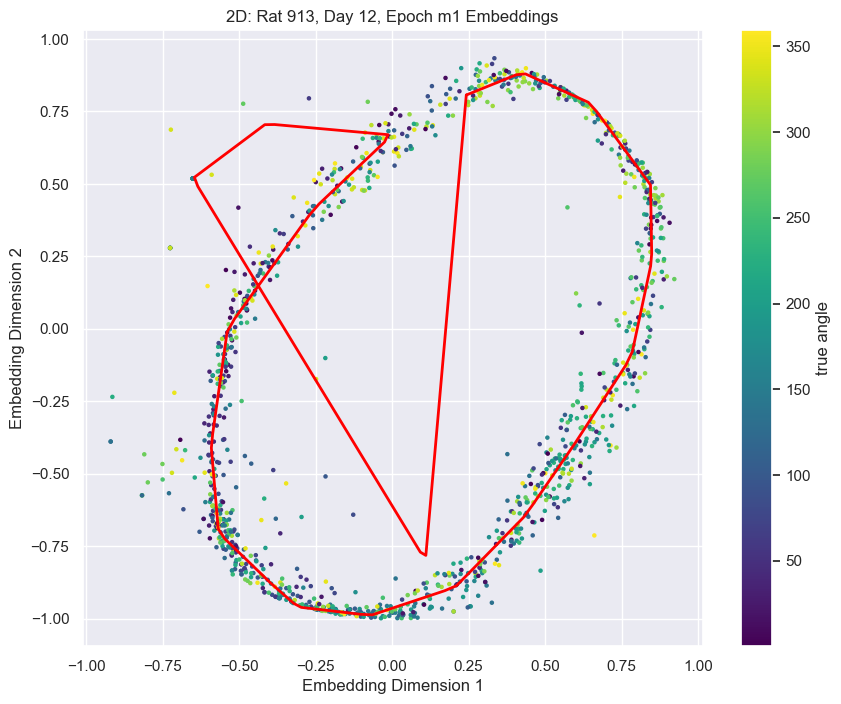

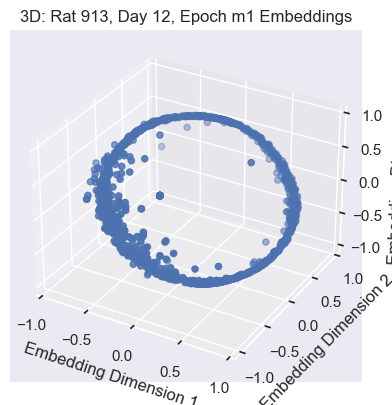

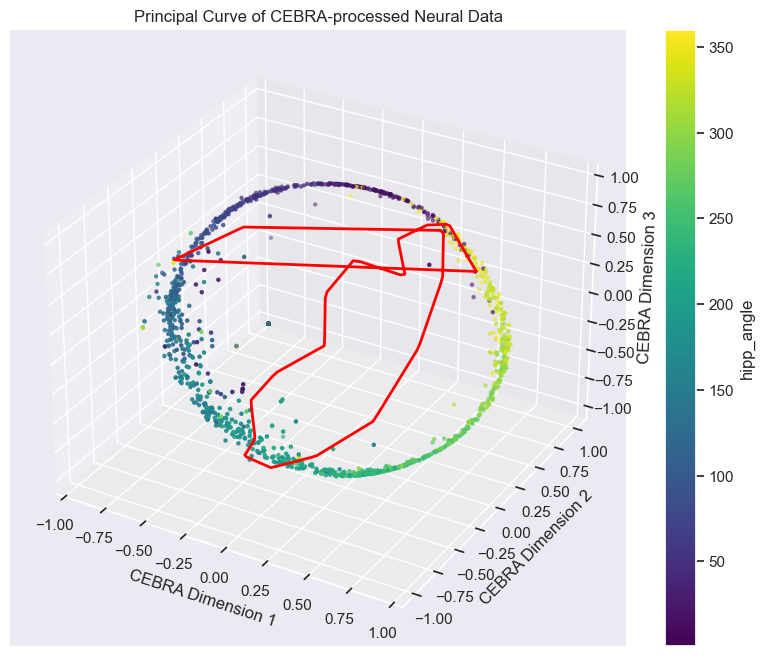

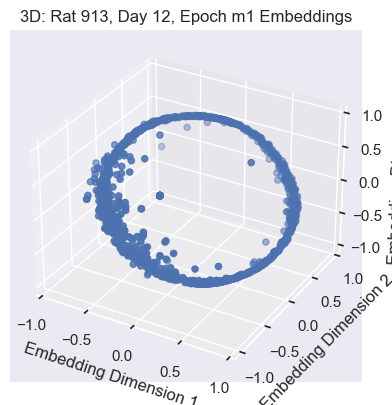

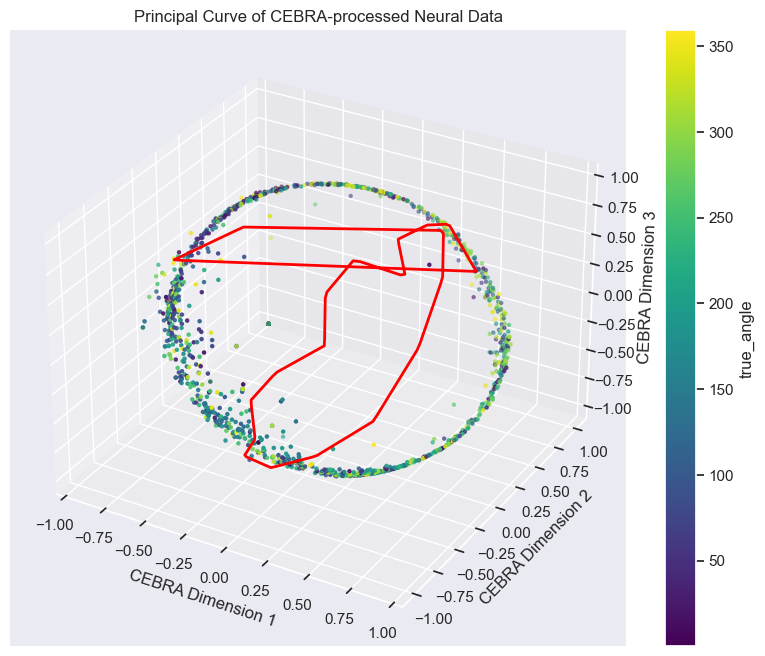

4
Computing UMAP embeddings...


/opt/anaconda3/envs/NRSC510/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


UMAP embeddings shape: (1557, 2)
Saved embedding plots to /Users/devenshidfar/Desktop/Masters/NRSC_510B/cebra_control_recal/results/session_44_embeddings.png


/var/folders/j3/sgby32516rl80nxb7vn4p93w0000gn/T/ipykernel_66608/388227147.py:232: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(tsne_embeddings[:, 0], tsne_embeddings[:, 1], s=10, cmap='viridis')


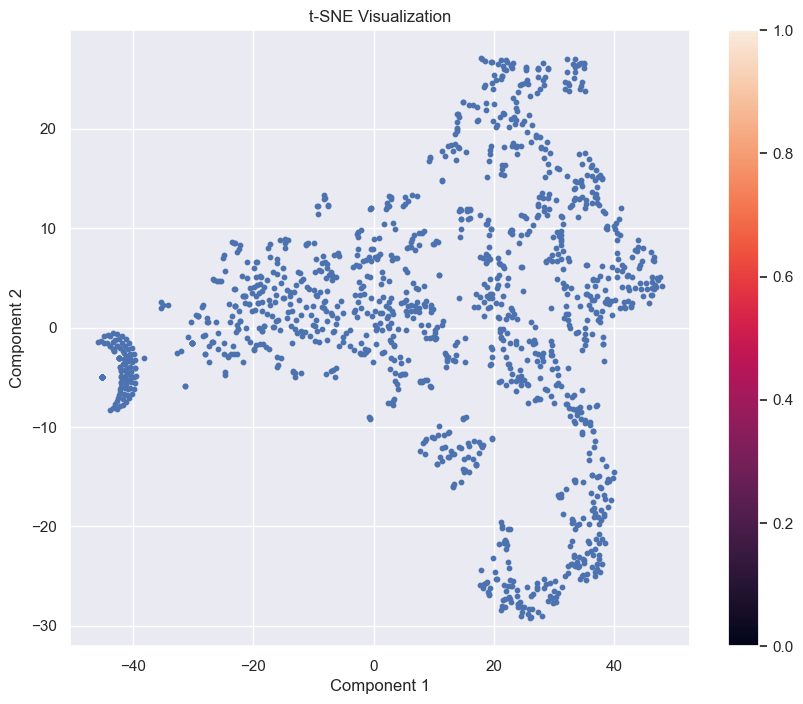

Saved embeddings metadata to /Users/devenshidfar/Desktop/Masters/NRSC_510B/cebra_control_recal/results/embeddings_metadata.csv
Processing session 45/65
Rat: 913, Day: 13, Epoch: m1
length of experiment in seconds 151.7001394
length of experiment in minutes 2.5283356566666666
Processing cluster: TT1/cl-maze1.1
Number of spikes: 608
Binned spikes shape: (1517,)
Skipping cluster TT1/cl-maze1.2 due to low isolation quality (4)
Processing cluster: TT11/cl-maze1.2
Number of spikes: 82
Binned spikes shape: (1517,)
Processing cluster: TT11/cl-maze1.5
Number of spikes: 116
Binned spikes shape: (1517,)
Skipping cluster TT11/cl-maze1.6 due to low isolation quality (4)
Processing cluster: TT11/cl-maze1.7
Number of spikes: 315
Binned spikes shape: (1517,)
Processing cluster: TT12/cl-maze1.1
Number of spikes: 337
Binned spikes shape: (1517,)
Processing cluster: TT14/cl-maze1.1
Number of spikes: 585
Binned spikes shape: (1517,)
Processing cluster: TT15/cl-maze1.1
Number of spikes: 20181
Binned spikes

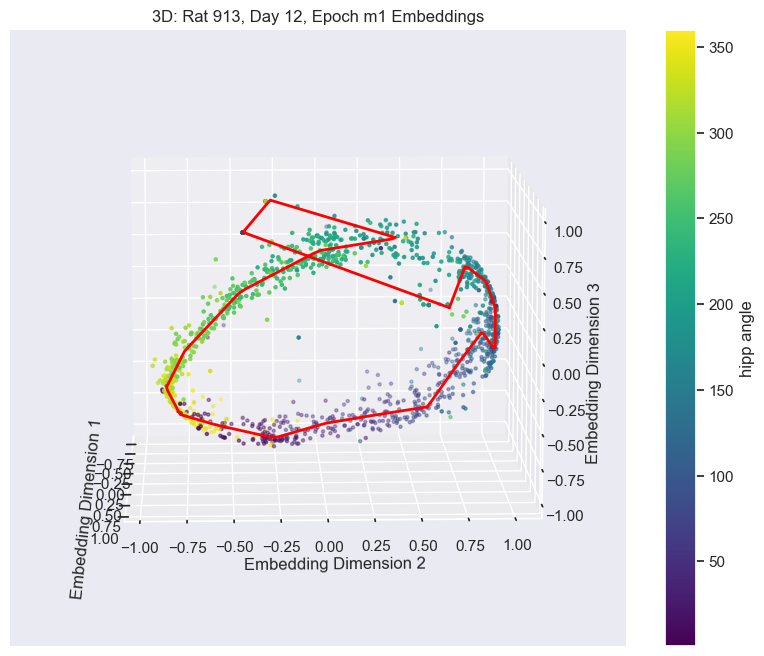

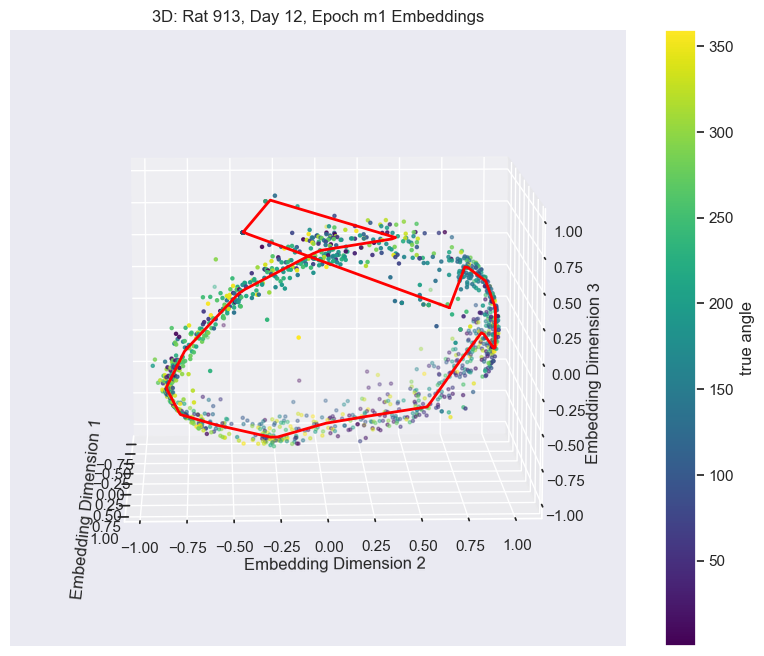

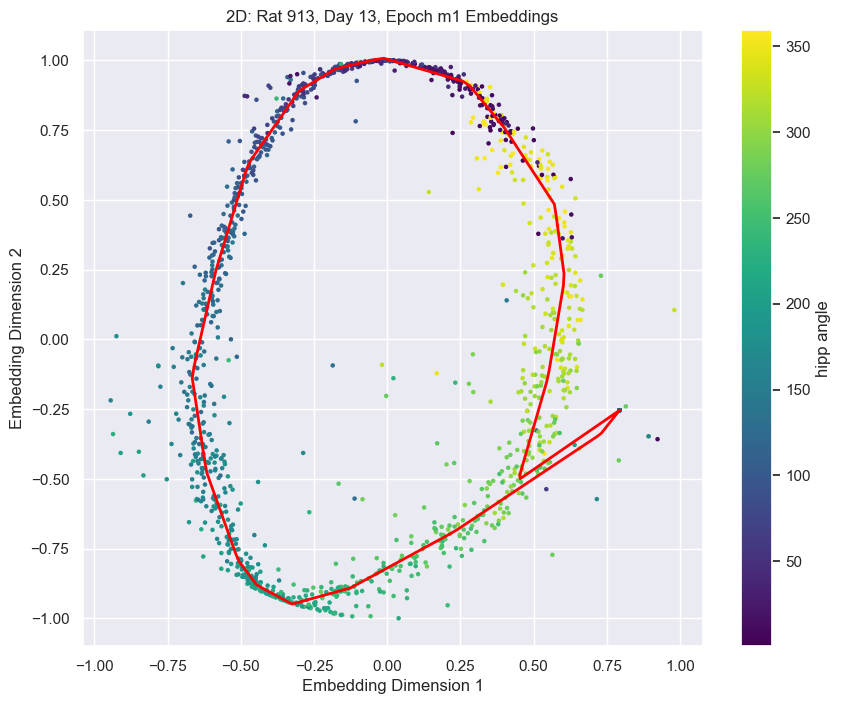

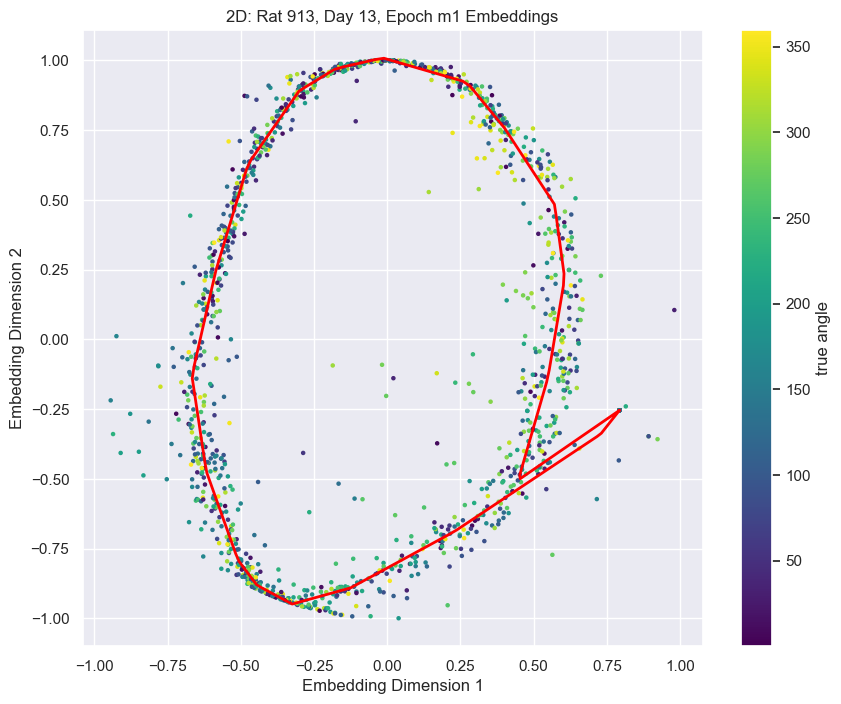

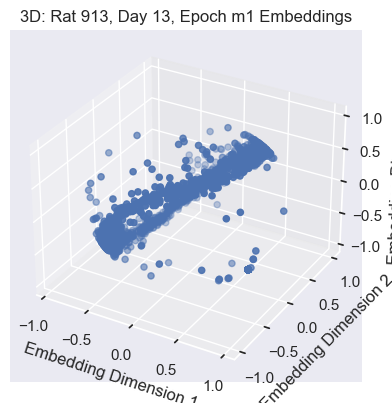

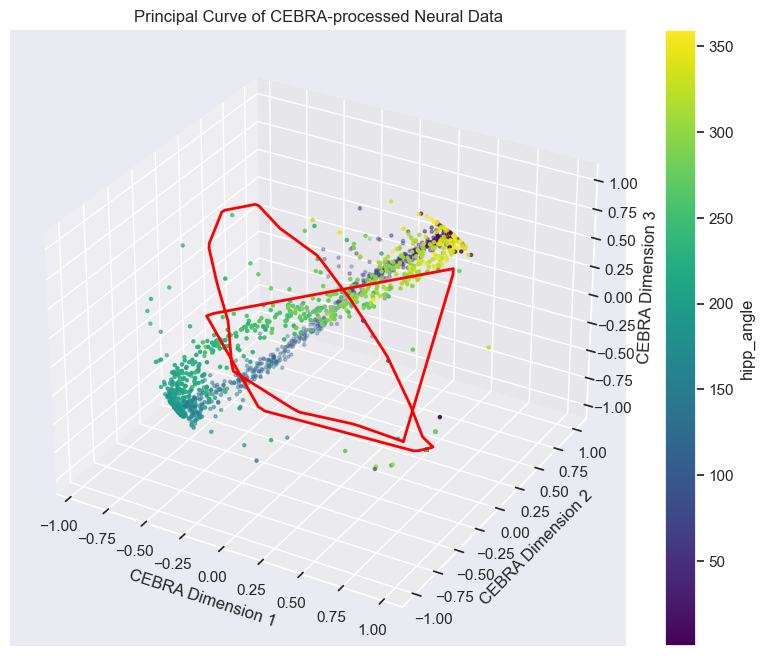

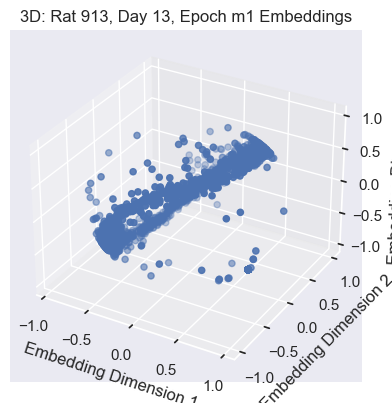

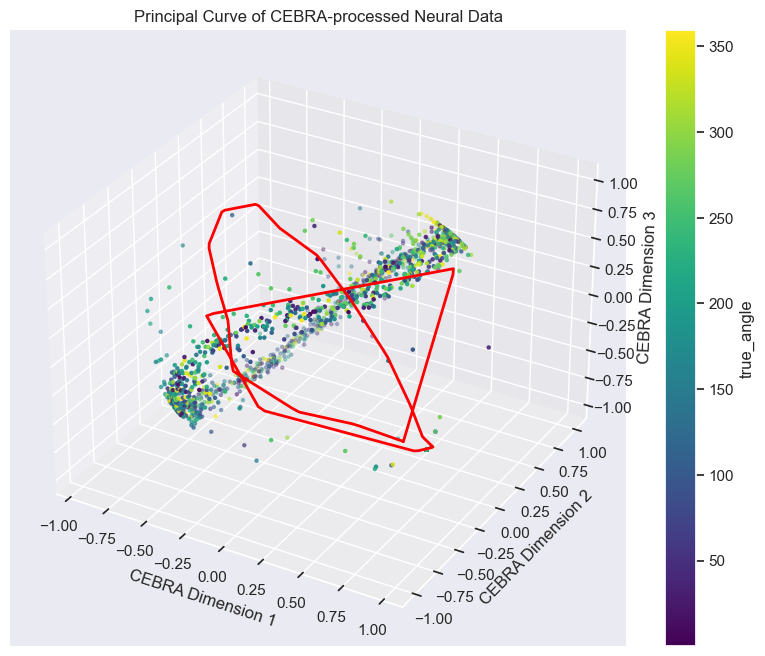

4
Computing UMAP embeddings...


/opt/anaconda3/envs/NRSC510/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


UMAP embeddings shape: (1516, 2)
Saved embedding plots to /Users/devenshidfar/Desktop/Masters/NRSC_510B/cebra_control_recal/results/session_45_embeddings.png


/var/folders/j3/sgby32516rl80nxb7vn4p93w0000gn/T/ipykernel_66608/388227147.py:232: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(tsne_embeddings[:, 0], tsne_embeddings[:, 1], s=10, cmap='viridis')


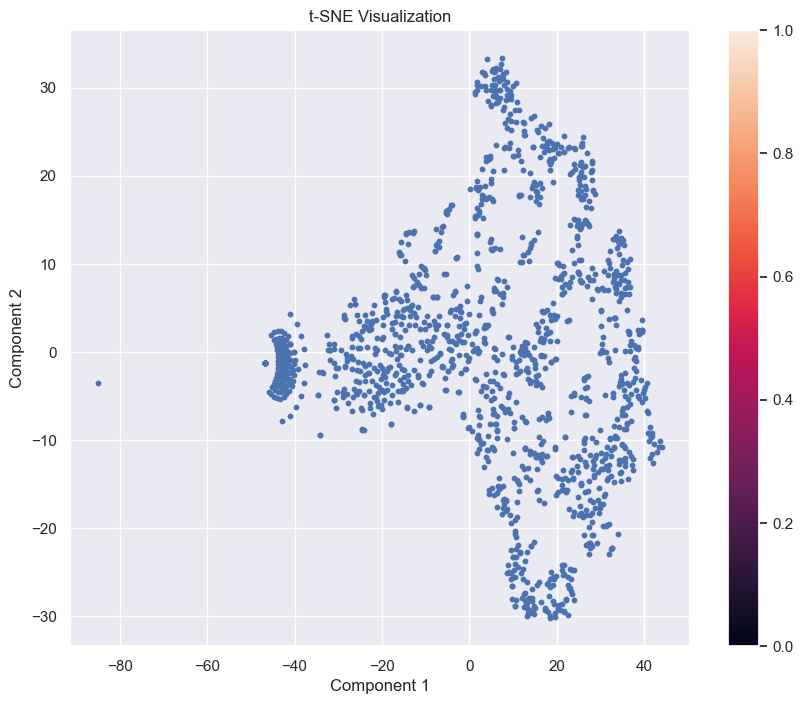

Saved embeddings metadata to /Users/devenshidfar/Desktop/Masters/NRSC_510B/cebra_control_recal/results/embeddings_metadata.csv
Processing session 46/65
Rat: 913, Day: 14, Epoch: m1
length of experiment in seconds 192.5715501
length of experiment in minutes 3.209525835
Processing cluster: TT1/cl-maze1.1
Number of spikes: 1850
Binned spikes shape: (1925,)
Skipping cluster TT1/cl-maze1.2 due to low isolation quality (4)
Processing cluster: TT1/cl-maze1.3
Number of spikes: 4100
Binned spikes shape: (1925,)
Processing cluster: TT11/cl-maze1.1
Number of spikes: 569
Binned spikes shape: (1925,)
Skipping cluster TT11/cl-maze1.3 due to low isolation quality (4)
Skipping cluster TT11/cl-maze1.5 due to low isolation quality (4)
Processing cluster: TT11/cl-maze1.7
Number of spikes: 63
Binned spikes shape: (1925,)
Skipping cluster TT11/cl-maze1.9 due to low isolation quality (4)
Skipping cluster TT12/cl-maze1.2 due to low isolation quality (4)
Processing cluster: TT15/cl-maze1.1
Number of spikes: 2

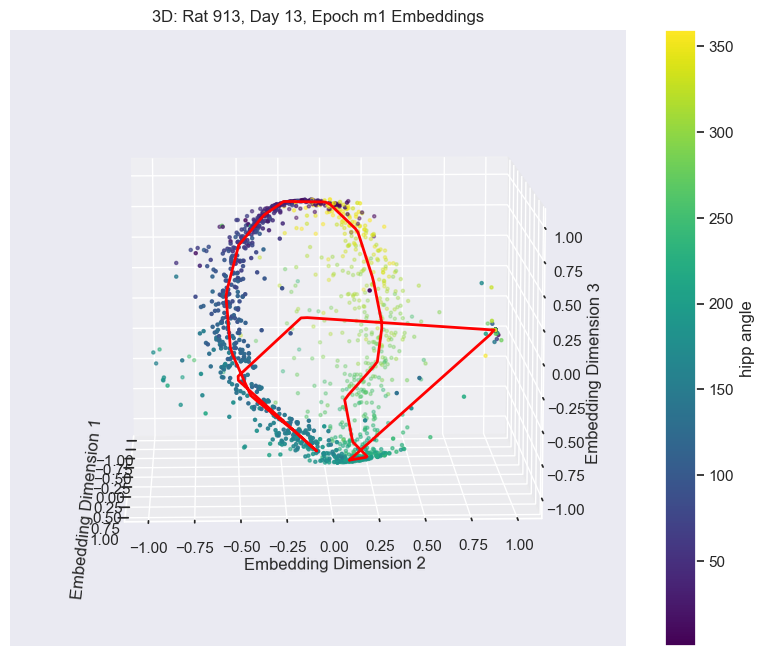

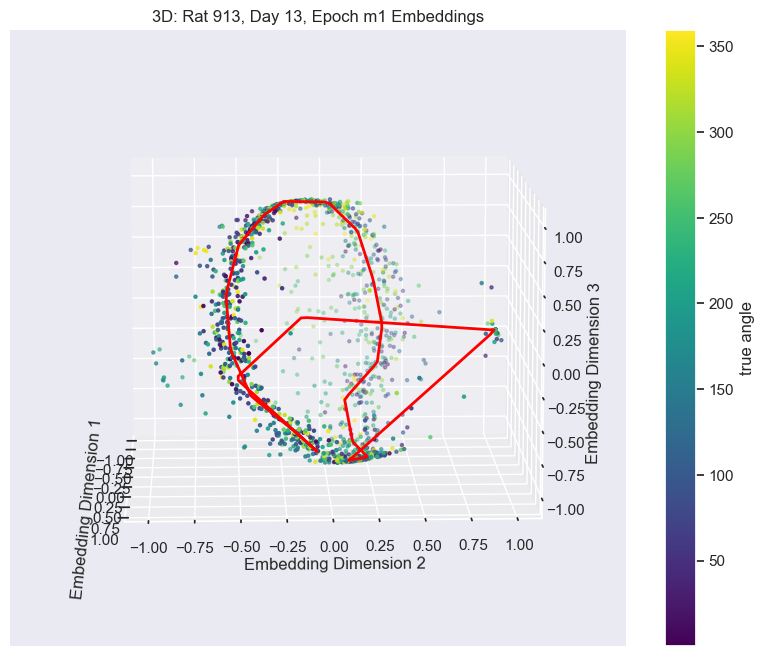

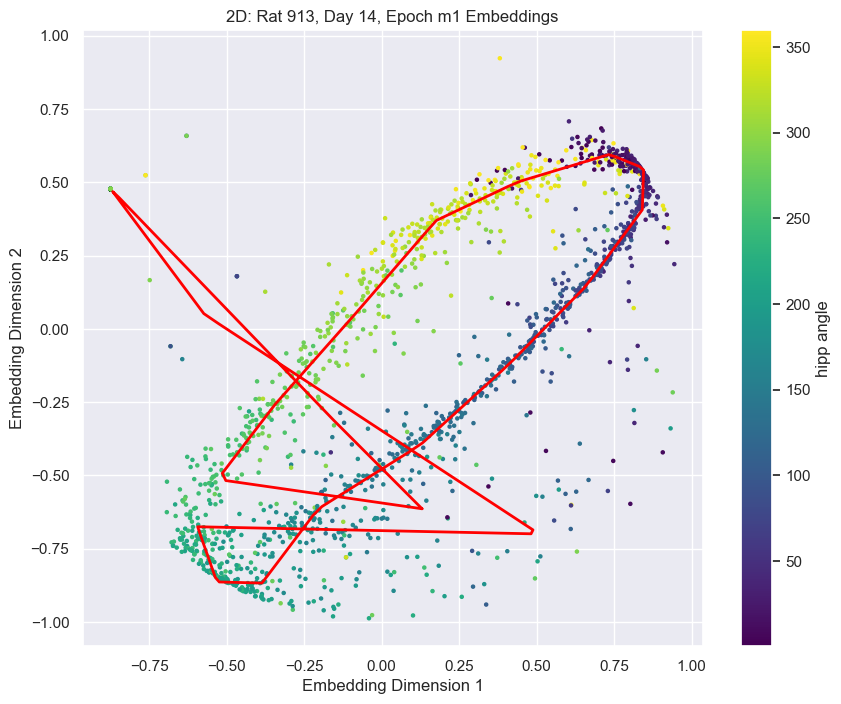

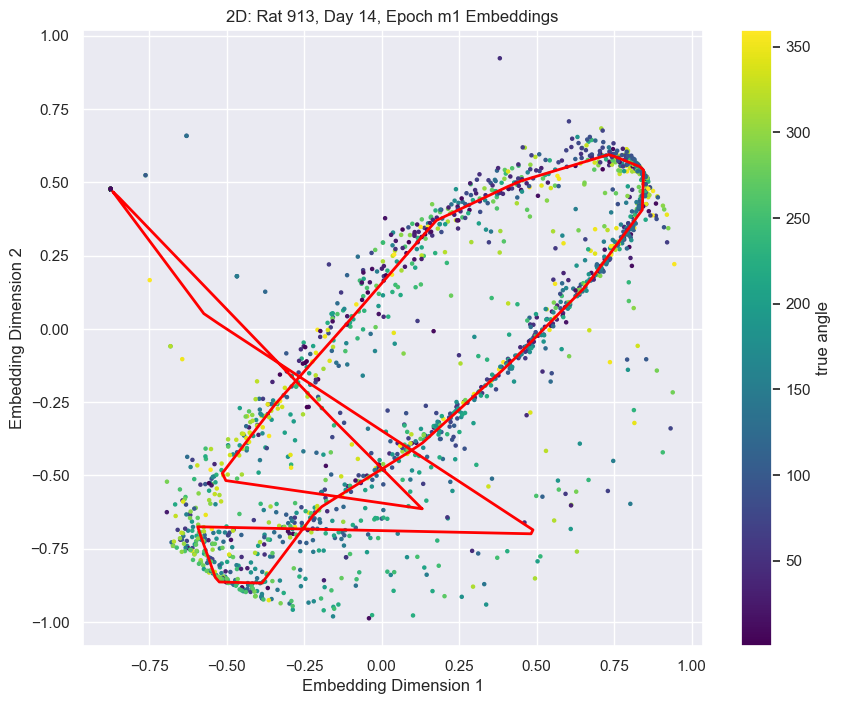

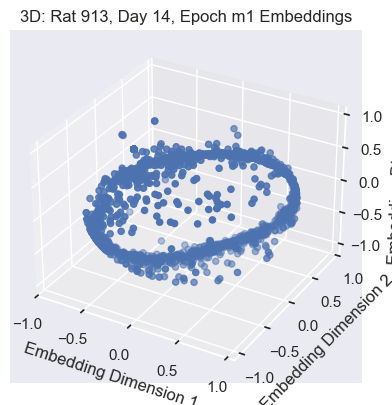

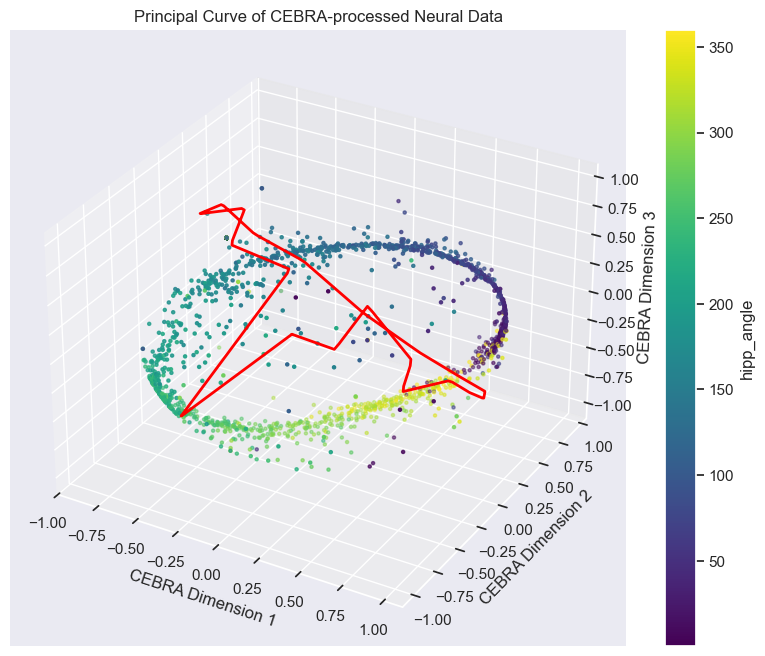

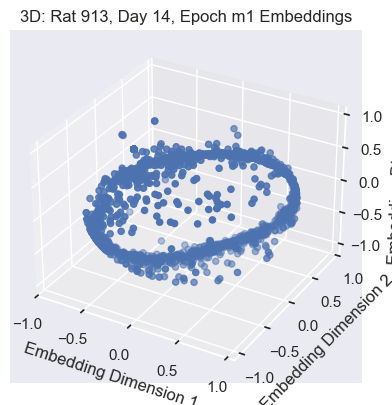

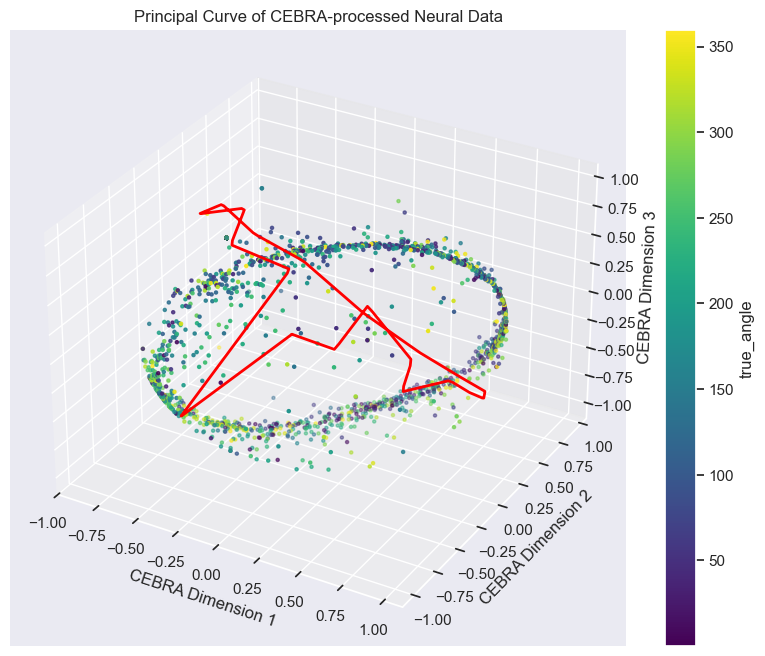

4
Computing UMAP embeddings...


/opt/anaconda3/envs/NRSC510/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


UMAP embeddings shape: (1925, 2)
Saved embedding plots to /Users/devenshidfar/Desktop/Masters/NRSC_510B/cebra_control_recal/results/session_46_embeddings.png


/var/folders/j3/sgby32516rl80nxb7vn4p93w0000gn/T/ipykernel_66608/388227147.py:232: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(tsne_embeddings[:, 0], tsne_embeddings[:, 1], s=10, cmap='viridis')


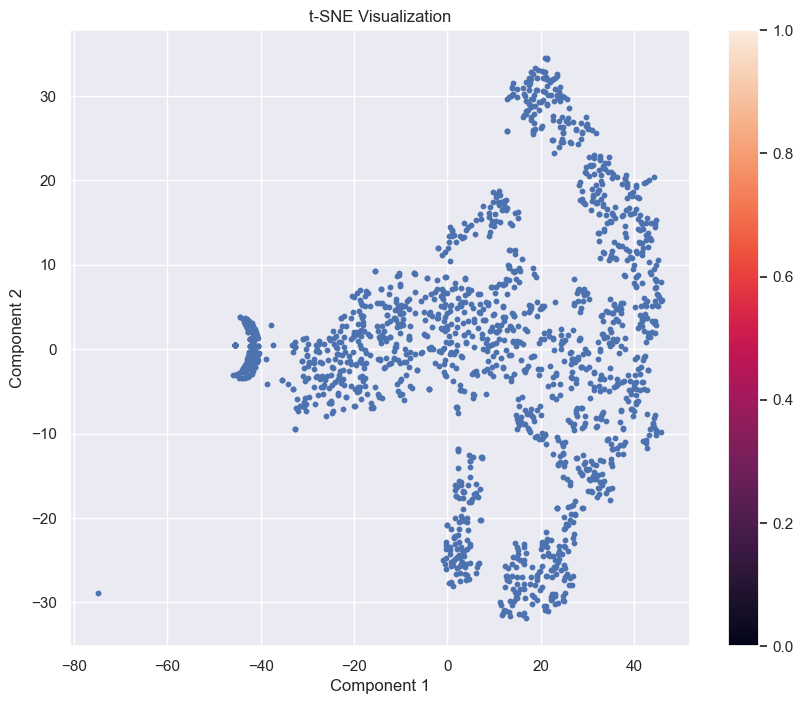

Saved embeddings metadata to /Users/devenshidfar/Desktop/Masters/NRSC_510B/cebra_control_recal/results/embeddings_metadata.csv
Processing session 47/65
Rat: 913, Day: 15, Epoch: m1
length of experiment in seconds 136.8121631
length of experiment in minutes 2.2802027183333333
Processing cluster: TT1/cl-maze1.2
Number of spikes: 836
Binned spikes shape: (1368,)
Processing cluster: TT1/cl-maze1.3
Number of spikes: 1684
Binned spikes shape: (1368,)
Processing cluster: TT11/cl-maze1.3
Number of spikes: 211
Binned spikes shape: (1368,)
Processing cluster: TT11/cl-maze1.4
Number of spikes: 188
Binned spikes shape: (1368,)
Skipping cluster TT11/cl-maze1.5 due to low isolation quality (4)
Skipping cluster TT11/cl-maze1.6 due to low isolation quality (4)
Processing cluster: TT11/cl-maze1.7
Number of spikes: 1079
Binned spikes shape: (1368,)
Processing cluster: TT12/cl-maze1.1
Number of spikes: 452
Binned spikes shape: (1368,)
Processing cluster: TT15/cl-maze1.1
Number of spikes: 54
Binned spikes

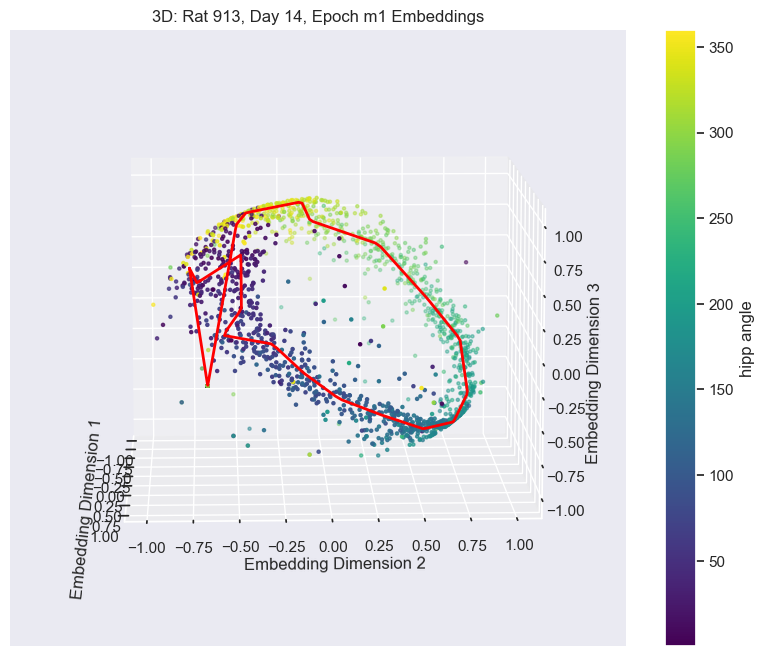

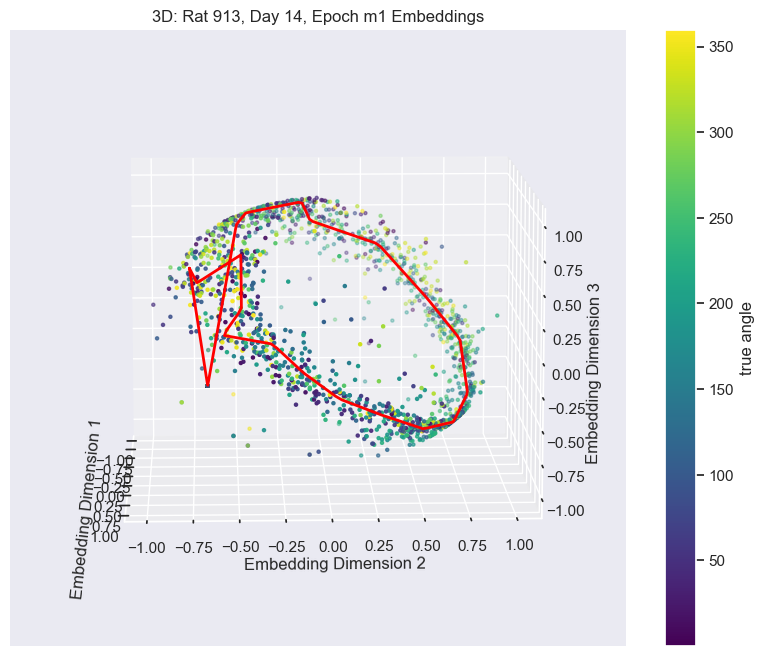

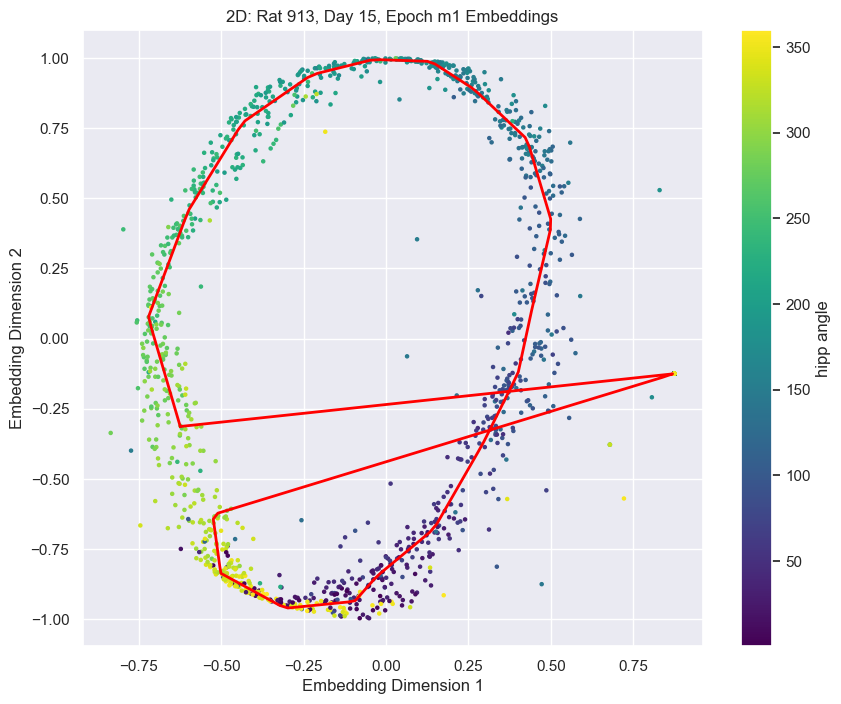

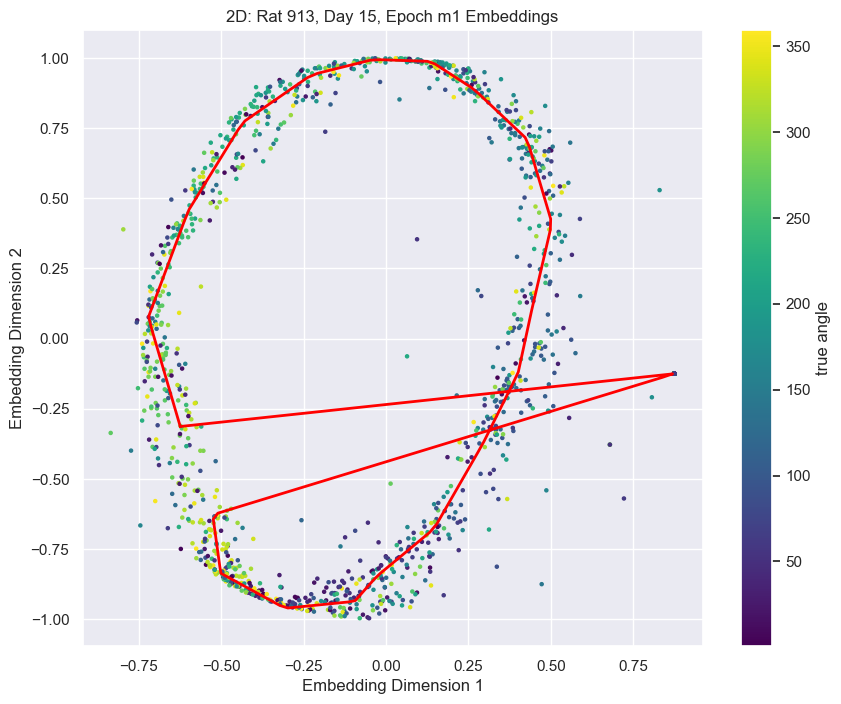

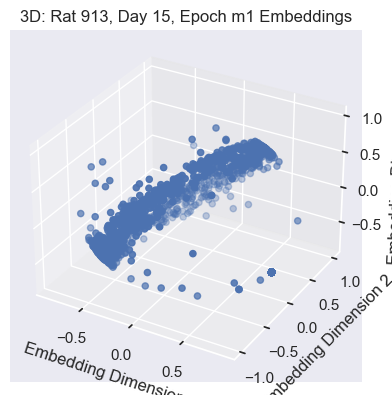

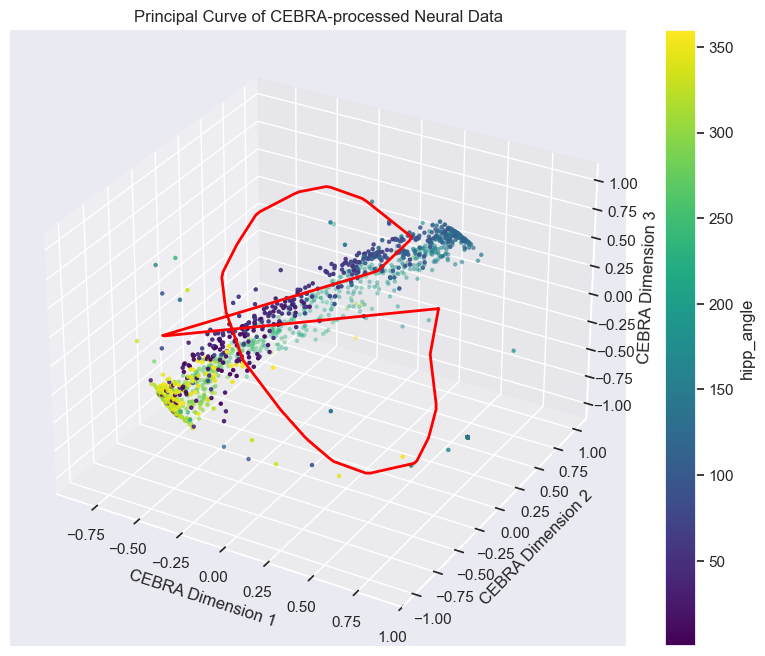

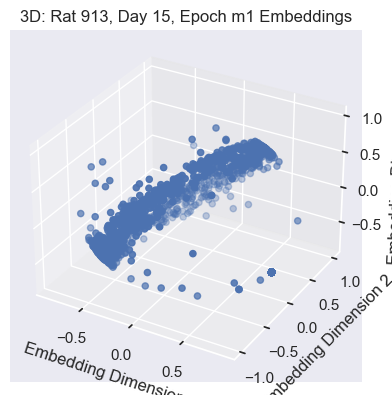

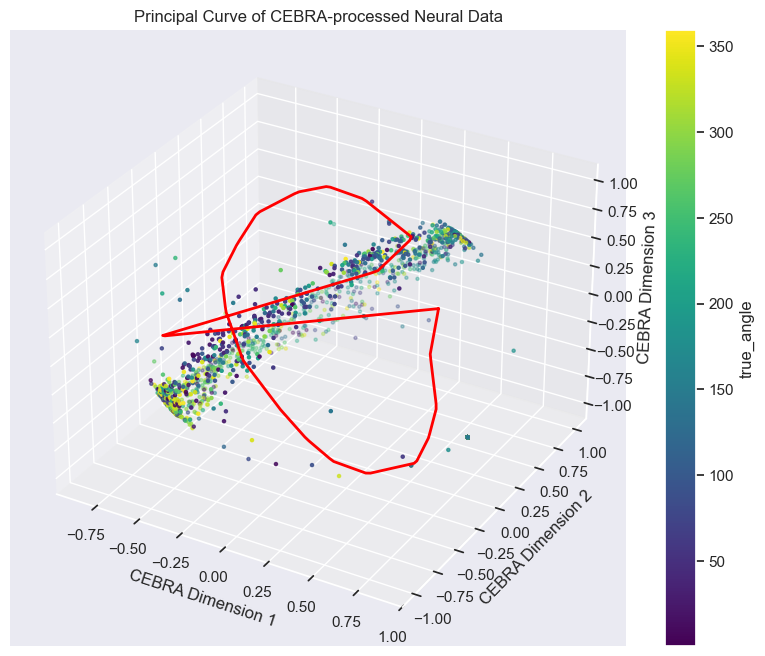

4
Computing UMAP embeddings...


/opt/anaconda3/envs/NRSC510/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


UMAP embeddings shape: (1368, 2)
Saved embedding plots to /Users/devenshidfar/Desktop/Masters/NRSC_510B/cebra_control_recal/results/session_47_embeddings.png


/var/folders/j3/sgby32516rl80nxb7vn4p93w0000gn/T/ipykernel_66608/388227147.py:232: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(tsne_embeddings[:, 0], tsne_embeddings[:, 1], s=10, cmap='viridis')


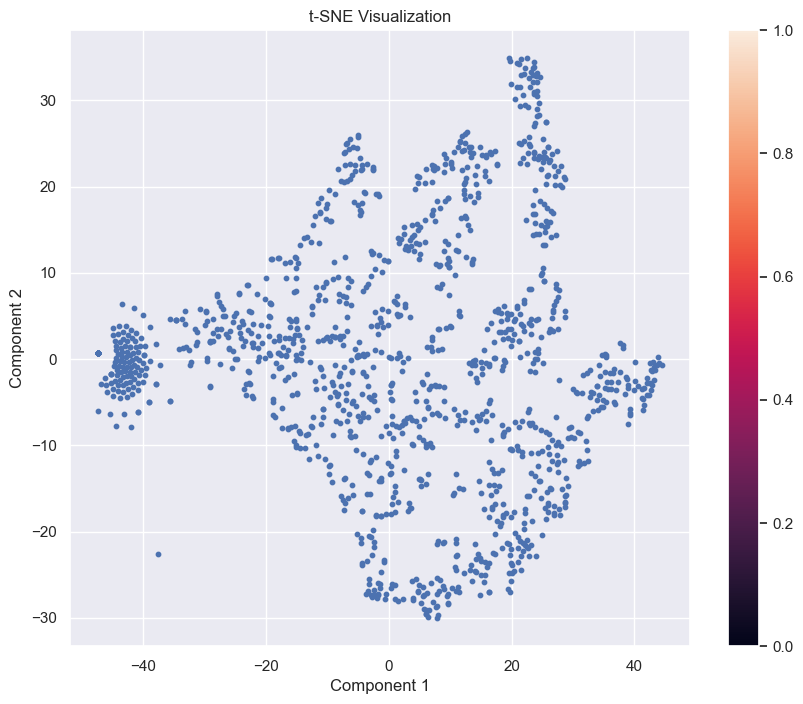

Saved embeddings metadata to /Users/devenshidfar/Desktop/Masters/NRSC_510B/cebra_control_recal/results/embeddings_metadata.csv
Processing session 48/65
Rat: 913, Day: 16, Epoch: m1
length of experiment in seconds 207.9595426
length of experiment in minutes 3.4659923766666667
Skipping cluster TT1/cl-maze1.4 due to low isolation quality (4)
Skipping cluster TT1/cl-maze1.5 due to low isolation quality (4)
Processing cluster: TT1/cl-maze1.6
Number of spikes: 1658
Binned spikes shape: (2079,)
Processing cluster: TT11/cl-maze1.11
Number of spikes: 518
Binned spikes shape: (2079,)
Skipping cluster TT11/cl-maze1.12 due to low isolation quality (4)
Processing cluster: TT11/cl-maze1.2
Number of spikes: 123
Binned spikes shape: (2079,)
Processing cluster: TT11/cl-maze1.4
Number of spikes: 567
Binned spikes shape: (2079,)
Processing cluster: TT11/cl-maze1.5
Number of spikes: 2354
Binned spikes shape: (2079,)
Skipping cluster TT11/cl-maze1.6 due to low isolation quality (4)
Processing cluster: TT12

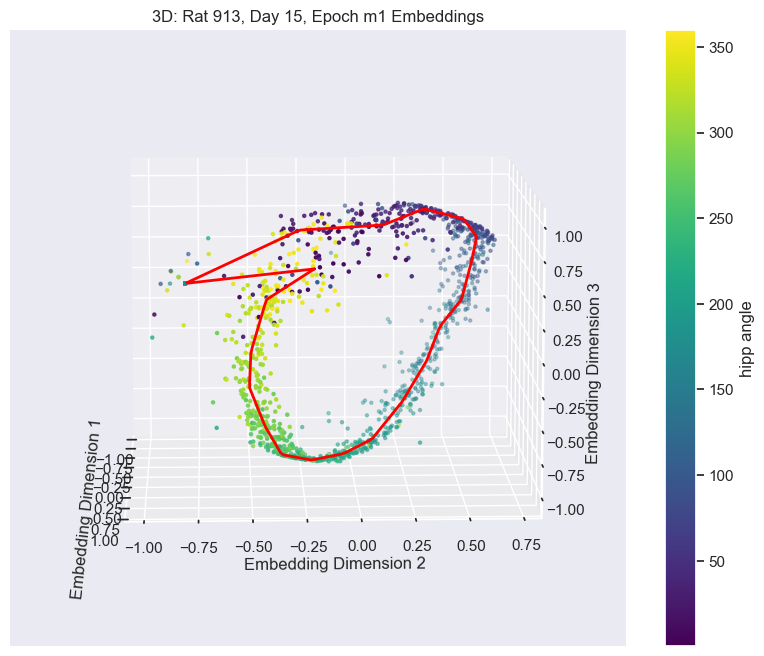

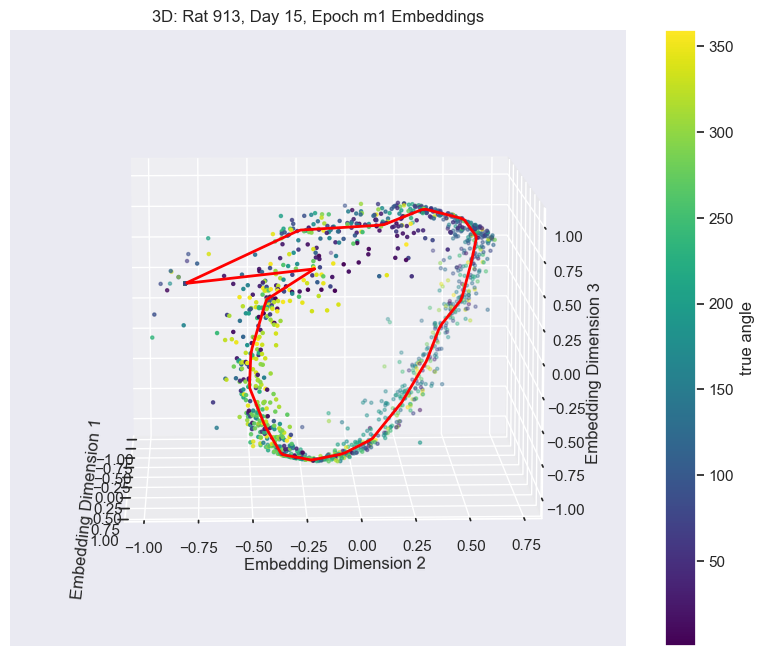

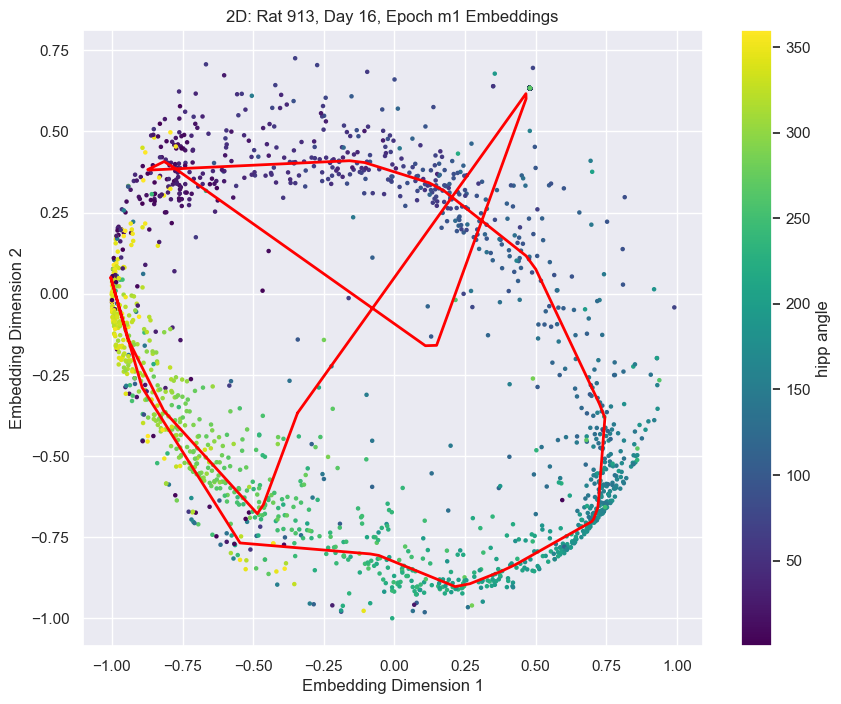

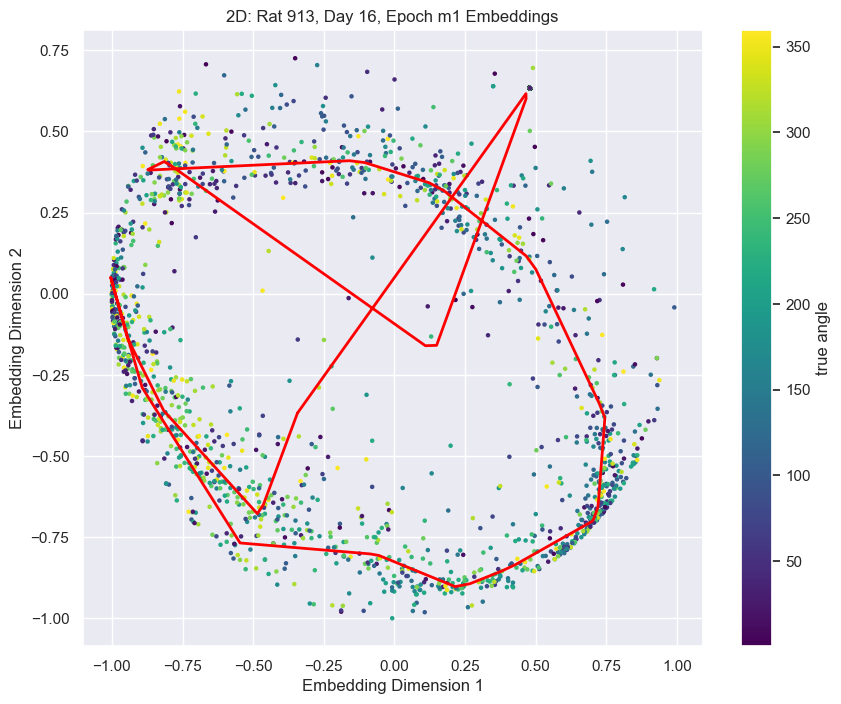

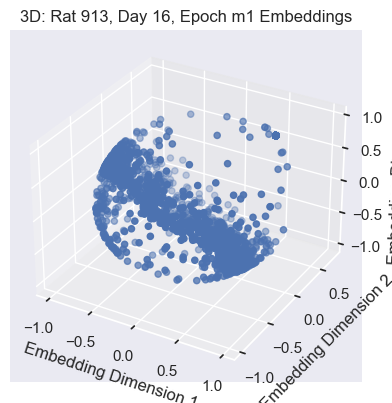

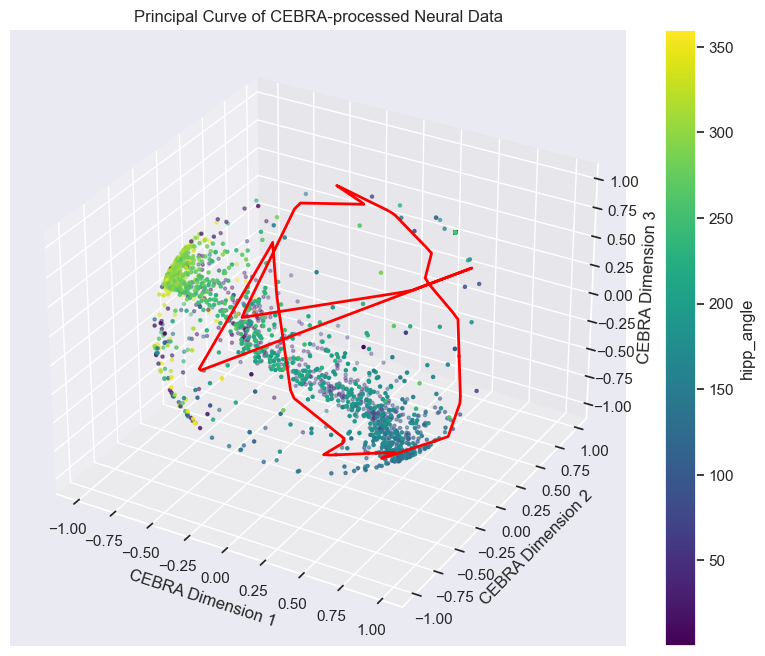

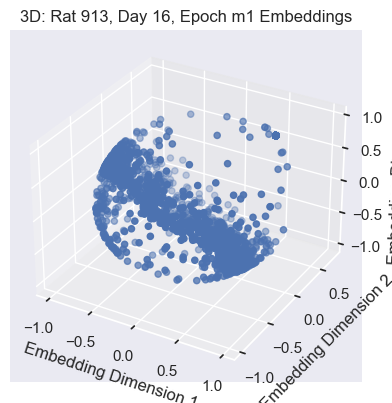

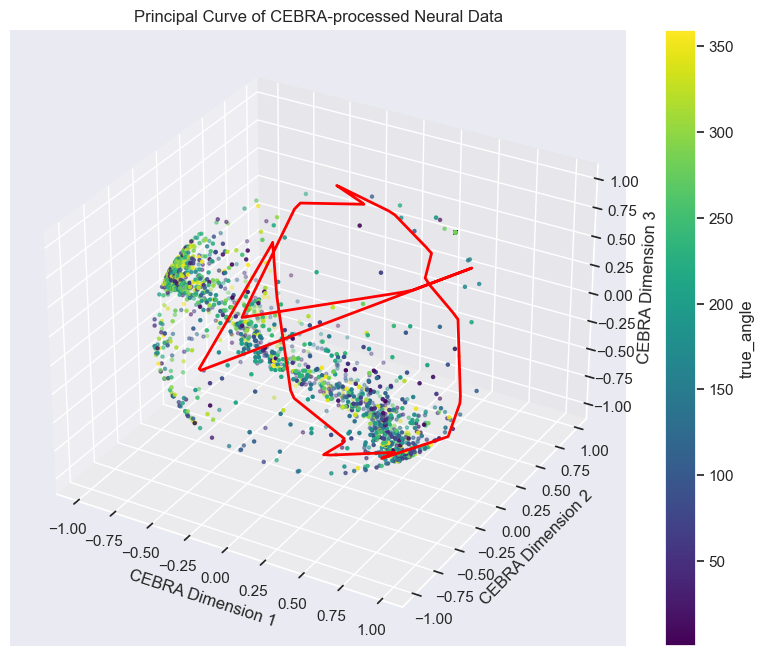

4
Computing UMAP embeddings...


/opt/anaconda3/envs/NRSC510/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


UMAP embeddings shape: (2079, 2)
Saved embedding plots to /Users/devenshidfar/Desktop/Masters/NRSC_510B/cebra_control_recal/results/session_48_embeddings.png


/var/folders/j3/sgby32516rl80nxb7vn4p93w0000gn/T/ipykernel_66608/388227147.py:232: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(tsne_embeddings[:, 0], tsne_embeddings[:, 1], s=10, cmap='viridis')


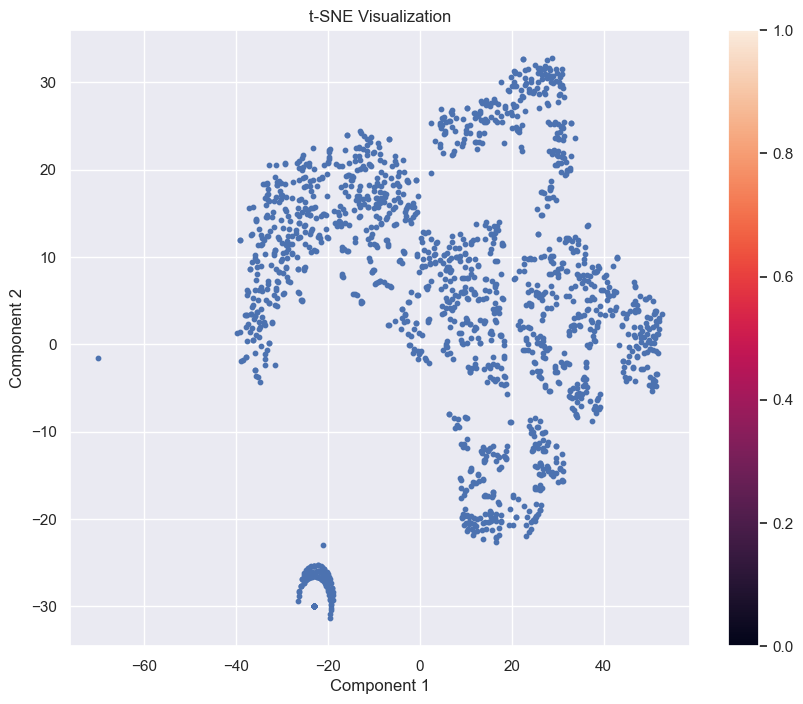

Saved embeddings metadata to /Users/devenshidfar/Desktop/Masters/NRSC_510B/cebra_control_recal/results/embeddings_metadata.csv


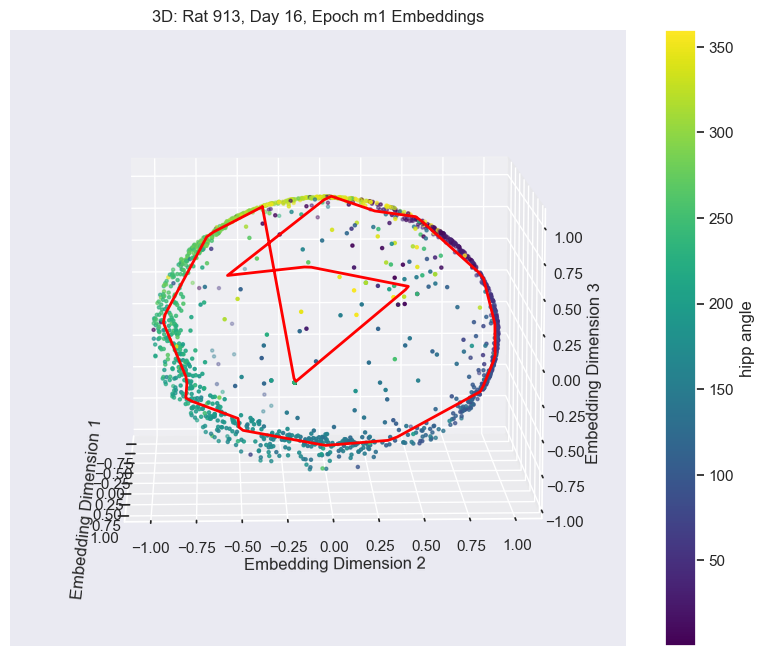

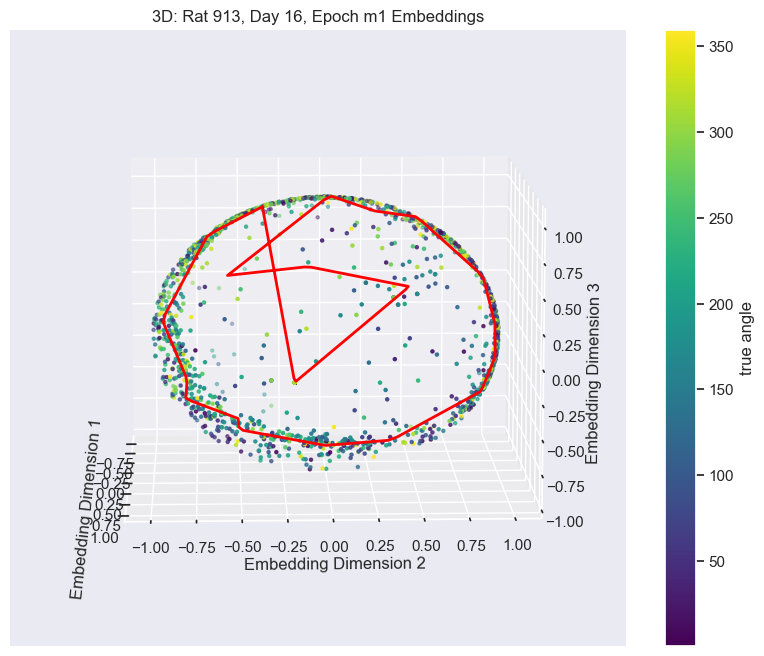

In [ ]:
num_trials = 10
control_point = 39
control_count = 0
model_save_path = '/Users/devenshidfar/Desktop/Masters/NRSC_510B/cebra_control_recal/models'
anim_save_path = '/Users/devenshidfar/Desktop/Masters/NRSC_510B/cebra_control_recal/3d_animations'
results_save_path = '/Users/devenshidfar/Desktop/Masters/NRSC_510B/cebra_control_recal/results'
#set to 1 to save the models
save_models = 1
save_anim = 1

os.makedirs(model_save_path, exist_ok=True)
os.makedirs(anim_save_path, exist_ok=True)
os.makedirs(results_save_path, exist_ok=True)

bin_sizes = [1]  # in seconds

embeddings_list = []
metadata_list = []

for bin_size in bin_sizes:

    print(f"bin_size: {bin_size}")

    for session_idx, session in enumerate(expt):

        control_count += 1

        if control_count <= control_point:
            print(f"Skipping session {session_idx + 1}")
            continue 
        elif control_count >= control_point + num_trials:
            break
            


        print(f"Processing session {session_idx + 1}/{len(expt)}")
        print(f"Rat: {session.rat}, Day: {session.day}, Epoch: {session.epoch}")

        # Prepare data
        ros_data = session.rosdata
        

        start_time = ros_data.startTs
        end_time = ros_data.stopTs
        total_time = end_time-start_time
        print(f"length of experiment in seconds {total_time/(10e6)}")
        print(f"length of experiment in minutes {total_time/((10e6)*60)}")


        all_spikes = []
        skipped_clusters = 0
        #num = 0
        for cluster in session.clust:
            try:
                if cluster.isolationQuality > 3:
                    print(f"Skipping cluster {cluster.name} due to low isolation quality ({cluster.isolationQuality})")
                    skipped_clusters += 1
                    continue
                spike_times = cluster.ts - start_time  # subtraction in microseconds
                print(f"Processing cluster: {cluster.name}")
                print(f"Number of spikes: {len(spike_times)}")
                
                # Bin spikes
                spike_times_sec = spike_times / 1e6
                start_time_sec = 0
                end_time_sec = (end_time - start_time) / 1e6
                
                if len(spike_times_sec) == 0:
                    print("Warning: Empty spike_times array")
                    continue  # Skip this cluster

                spike_times_sec = spike_times_sec[np.isfinite(spike_times_sec)]
                spike_times_sec = spike_times_sec[(spike_times_sec >= start_time_sec) & (spike_times_sec <= end_time_sec)]

                bins = np.arange(start_time_sec, end_time_sec, bin_size)
                #print(f"bins: {bins[:5]}")

                binned_spikes, _, _ = stats.binned_statistic( #could also use np.histogram I believe
                    spike_times_sec, 
                    np.ones_like(spike_times_sec), 
                    statistic='sum', 
                    bins=bins
                )

                all_spikes.append(binned_spikes)
                #print(binned_spikes[20:35])
                print(f"Binned spikes shape: {binned_spikes.shape}")

            except Exception as cluster_error:
                print(f"Error processing cluster {cluster.name}: {str(cluster_error)}")
                continue

        print(f"Number of processed clusters: {len(all_spikes)}")
        print(f"Number of skipped clusters due to low isolation quality: {skipped_clusters}")

        if not all_spikes:
            print("No valid spike data found")
            continue


        print(f"all spikes shape {len(all_spikes)}")

        neural_data = np.array(all_spikes).T

        neural_times = np.arange(0, (end_time - start_time) / 1e6, bin_size)
        #interp_angle = np.interp(neural_times, (angle_times - start_time) / 1e6, angle)

        print(f"Neural data shape: {neural_data.shape}")


        if not all_spikes:
            print("No valid spike data found")
            continue

        print(f"Neural data shape: {neural_data.shape}")

        num_bins = int(np.floor((end_time - start_time) / 1e6 / bin_size))

        # Extract estGain and hippAngle
        try:
            est_gain = np.array(ros_data.estGain)        # Estimated hippocampal gain at encTimes
            hipp_angle = np.array(ros_data.hippAngle)
            true_angle = np.array(ros_data.encAngle)
            print(f"hipp angle: {hipp_angle[20:30]}")
            print(f"lab frame angle: {true_angle[20:30]}")    
            print(f"est gain: {est_gain[20:30]}") 
            enc_times = np.array(ros_data.encTimes) / 1e6  # Convert to seconds
        except KeyError as e:
            print(f"Missing attribute in rosdata: {e}")
            continue  # Skip this session if attributes are missing


        sampling_rate = 100  # 100 Hz found that looking at data
        samples_per_bin = int(bin_size * sampling_rate)

        # Ensure that the length of est_gain and hipp_angle is divisible by samples_per_bin
        total_samples = len(est_gain)
        num_bins_est = total_samples // samples_per_bin

        if num_bins_est == 0:
            print(f"Error: bin_size {bin_size}s is too large for the number of estGain samples.")
            continue

        # Truncate est_gain and hipp_angle to fit into full bins
        est_gain_truncated = est_gain[:num_bins_est * samples_per_bin]
        hipp_angle_truncated = hipp_angle[:num_bins_est * samples_per_bin]
        true_angle_truncated = true_angle[:num_bins_est * samples_per_bin]
        enc_times_truncated = enc_times[:num_bins_est * samples_per_bin]
        

        # Reshape and average
        est_gain_binned = est_gain_truncated.reshape(num_bins_est, samples_per_bin).mean(axis=1)
        hipp_angle_binned = hipp_angle_truncated.reshape(num_bins_est, samples_per_bin).mean(axis=1)
        true_angle_binned = true_angle_truncated.reshape(num_bins_est, samples_per_bin).mean(axis=1)

        # If bin_size is not a divisor of the total time, pad the remaining samples
        # if len(est_gain) > num_bins_est * samples_per_bin:
        #     est_gain_extra = est_gain[num_bins_est * samples_per_bin:]
        #     hipp_angle_extra = hipp_angle[num_bins_est * samples_per_bin:]
        #     true_angle_extra = true_angle[num_bins_est * samples_per_bin:]
            # Optionally, handle the extra samples (e.g., ignore or pad)
            # est_gain_binned = np.concatenate([est_gain_binned, [est_gain_extra.mean()]])
            # hipp_angle_binned = np.concatenate([hipp_angle_binned, [hipp_angle_extra.mean()]])
            # true_angle_binned = np.concatenate([true_angle_binned, [true_angle_extra.mean()]])
            # num_bins_est += 1

        print(f"Aggregated est_gain_binned shape: {est_gain_binned.shape}")
        print(f"Aggregated hipp_angle_binned shape: {hipp_angle_binned.shape}")
        print(f"Aggregated true_angle_binned shape: {true_angle_binned.shape}")

        # Check if annotate length matches neural_data
        if num_bins_est != num_bins:
            print(f"Warning: Number of aggregated bins ({num_bins_est}) does not match neural_data bins ({num_bins}).")
            # trim or padding
            min_bins = min(num_bins_est, num_bins)
            est_gain_binned = est_gain_binned[:min_bins]
            hipp_angle_binned = hipp_angle_binned[:min_bins]
            true_angle_binned = true_angle_binned[:min_bins]
            neural_data = neural_data[:min_bins, :]
            neural_times = neural_times[:min_bins]
            print(f"Adjusted neural_data and time arrays to {min_bins} bins.")

        embeddings_2d_list = []
        embeddings_3d_list = []

        # Apply CEBRA in 2D, and 3D
        embeddings_2d = apply_cebra(neural_data,2)
        embeddings_3d = apply_cebra(neural_data,3)

        embeddings_2d_list.append(embeddings_2d)
        embeddings_3d_list.append(embeddings_3d)

        #fit curve (adapted from Chaudhuri et al.)
        principal_curve_2d, curve_params_2d = fit_spud_to_cebra(embeddings_2d)
        principal_curve_3d, curve_params_3d = fit_spud_to_cebra(embeddings_3d)

        print(1)
        plot_in_2d(embeddings_2d,session, hipp_angle_binned % 360, "hipp angle", principal_curve_2d)
        plot_in_2d(embeddings_2d,session, true_angle_binned % 360, "true angle", principal_curve_2d)
        # print(2)
        # plot_in_2d(embeddings_2d,session, est_gain_binned,"est gain", principal_curve_2d)
        # print(3)
        plot_in_3d(embeddings_2d,session,hipp_angle_binned % 360, "hipp_angle", principal_curve_3d)
        plot_in_3d(embeddings_2d,session, true_angle_binned % 360, "true_angle", principal_curve_3d)
        print(4)
        # plot_in_3d(embeddings_2d,session,est_gain_binned, "est gain",principal_curve_3d)
        # print(5)
        print("Computing UMAP embeddings...")
        umap_reducer = umap.UMAP(n_components=2, random_state=42)
        umap_embeddings = umap_reducer.fit_transform(neural_data)
        print(f"UMAP embeddings shape: {umap_embeddings.shape}")

        # Plot CEBRA 2D, CEBRA 3D (projected to 2D), and UMAP 2D side by side
        plot_save_path = os.path.join(results_save_path, f"session_{session_idx + 1}_embeddings.png")
        plot_embeddings_side_by_side(
            embeddings_2d=embeddings_2d,
            embeddings_3d=embeddings_3d,
            umap_embeddings=umap_embeddings,
            session=session,
            hipp_angle_binned=hipp_angle_binned,
            true_angle_binned=true_angle_binned,
            principal_curve_2d=principal_curve_2d,
            principal_curve_3d=principal_curve_3d,
            save_path=plot_save_path
        )

        tsne = TSNE(n_components=2, perplexity=30, random_state=42)

        tsne_embeddings = tsne.fit_transform(neural_data)
        
        plt.figure(figsize=(10, 8))
        plt.scatter(tsne_embeddings[:, 0], tsne_embeddings[:, 1], s=10, cmap='viridis')
        plt.title('t-SNE Visualization')
        plt.xlabel('Component 1')
        plt.ylabel('Component 2')
        plt.colorbar()
        plt.show()


        #model_shuffled = cebra.CEBRA(output_dimension=2, batch_size=128)
        #model_shuffled_hipp_hipp.fit(np.random.permutation(neural_data))
        #shuffled_embeddings = model_shuffled.transform(neural_data)
        # Visualize results

        anim_save_file = f"{anim_save_path}/bin_size-{bin_size}/{session_idx}"

        create_rotating_3d_plot(embeddings_3d, session, hipp_angle_binned % 360, "hipp angle",anim_save_file, save_anim, principal_curve_3d)
        create_rotating_3d_plot(embeddings_3d, session, true_angle_binned % 360, "true angle",anim_save_file, save_anim, principal_curve_3d)


        # Save embeddings if required
        if save_models:
            embedding_filename_2d = f"bin_size-{bin_size}_embeddings_2d_rat{session.rat}_day{session.day}_epoch{session.epoch}.npy"
            embedding_filename_3d = f"bin_size-{bin_size}_embeddings_3d_rat{session.rat}_day{session.day}_epoch{session.epoch}.npy"
            np.save(os.path.join(model_save_path, embedding_filename_2d), embeddings_2d)
            np.save(os.path.join(model_save_path, embedding_filename_3d), embeddings_3d)

        # Collect embeddings and metadata for potential future use
        embeddings_list.append({
            'session_idx': session_idx + 1,
            'rat': session.rat,
            'day': session.day,
            'epoch': session.epoch,
            'bin_size': bin_size,
            'embeddings_2d': embeddings_2d,
            'embeddings_3d': embeddings_3d,
            'hipp_angle_binned': hipp_angle_binned,
            'est_gain_binned': est_gain_binned,
            'true_angle_binned': true_angle_binned
        })

        # Optionally, save metadata to a CSV for reference
        metadata_list.append({
            'session_idx': session_idx + 1,
            'rat': session.rat,
            'day': session.day,
            'epoch': session.epoch,
            'bin_size': bin_size,
            'embedding_filename_2d': embedding_filename_2d,
            'embedding_filename_3d': embedding_filename_3d
        })

        # After processing all sessions, save metadata
        metadata_df = pd.DataFrame(metadata_list)
        metadata_csv_path = os.path.join(results_save_path, 'embeddings_metadata.csv')
        metadata_df.to_csv(metadata_csv_path, index=False)
        print(f"Saved embeddings metadata to {metadata_csv_path}")

        

    

test labels true[315.35395623 247.81145623 134.09655389 265.77432245 352.35080194
  74.08604608 329.31182245 245.68583123  79.10256952  89.89395135]
test labels hipp[268.7089719  163.43857019 184.16039015 265.77432245  59.98630318
 145.13827708 322.44776517 194.1250902  147.67030166  89.52522717]
hipp angle pred [237.15843061 166.61202462 186.27512936 233.80945136  56.63000507
 187.63098908 301.41049666 194.69450042 148.85046327  59.9218671 ]


/var/folders/j3/sgby32516rl80nxb7vn4p93w0000gn/T/ipykernel_66608/1121527686.py:192: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[0].set_xticklabels(labels_bar, rotation=45, ha='right')


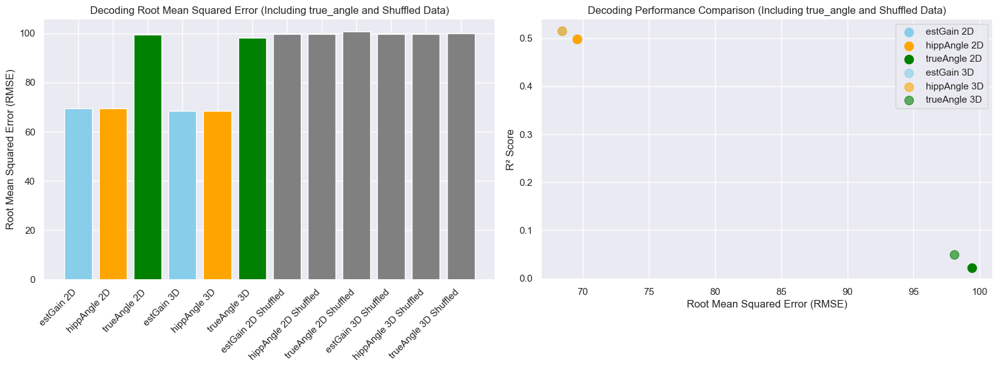

,Embedding Dimension,Variable,R² Score,RMSE
0,2D,estGain,0.498382,69.597053
1,2D,hippAngle,0.498382,69.597053
2,2D,trueAngle,0.022151,99.433249
3,3D,estGain,0.515196,68.420657
4,3D,hippAngle,0.515196,68.420657
5,3D,trueAngle,0.049046,98.056276
6,2D Shuffled,estGain,-0.037620,99.774805
7,2D Shuffled,hippAngle,-0.037620,99.774805
8,2D Shuffled,trueAngle,-0.020608,100.678918
9,3D Shuffled,estGain,-0.037429,99.765628


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.model_selection import train_test_split
import pandas as pd

hipp_angle_binned = hipp_angle_binned % 360
true_angle_binned = true_angle_binned % 360
shuffled_est_gain_binned = np.random.permutation(est_gain_binned)
shuffled_hipp_angle_binned = np.random.permutation(hipp_angle_binned)
shuffled_true_angle_binned = np.random.permutation(true_angle_binned)


def evaluate_decoding(true, pred):
    r2 = r2_score(true, pred)
    mse = mean_squared_error(true, pred)
    rmse = np.sqrt(mse)
    return r2, rmse


# make sure variables are defined and raise error if not
required_vars = ['embeddings_2d', 'embeddings_3d', 'hipp_angle_binned', 'est_gain_binned']
for var in required_vars:
    if var not in globals():
        raise ValueError(f"Variable '{var}' is not defined.")
    

# embeddings_2d = apply_cebra(neural_data,2)
# embeddings_3d = apply_cebra(neural_data,3)

# Split the data into training and testing sets
# Using 80% for training and 20% for testing
# Setting a random state for reproducibility
# Split the data into training and testing sets for hipp_angle
# Split the data into training and testing sets for hipp_angle
train_emb_2d_hipp, test_emb_2d_hipp, train_labels_hipp, test_labels_hipp = train_test_split(
    embeddings_2d, hipp_angle_binned, test_size=0.2, random_state=42
)

train_emb_3d_hipp, test_emb_3d_hipp, train_labels_hipp_3d, test_labels_hipp_3d = train_test_split(
    embeddings_3d, hipp_angle_binned, test_size=0.2, random_state=42
)

# Split the data into training and testing sets for true_angle
train_emb_2d_true, test_emb_2d_true, train_labels_true, test_labels_true = train_test_split(
    embeddings_2d, true_angle_binned, test_size=0.2, random_state=42
)

train_emb_3d_true, test_emb_3d_true, train_labels_true_3d, test_labels_true_3d = train_test_split(
    embeddings_3d, true_angle_binned, test_size=0.2, random_state=42
)

# Split the data into training and testing sets for shuffled hipp_angle
train_emb_2d_shuffled_hipp, test_emb_2d_shuffled_hipp, train_labels_shuffled_hipp, test_labels_shuffled_hipp = train_test_split(
    embeddings_2d, shuffled_hipp_angle_binned, test_size=0.2, random_state=42
)

train_emb_3d_shuffled_hipp, test_emb_3d_shuffled_hipp, train_labels_shuffled_hipp_3d, test_labels_shuffled_hipp_3d = train_test_split(
    embeddings_3d, shuffled_hipp_angle_binned, test_size=0.2, random_state=42
)

# Split the data into training and testing sets for shuffled true_angle
train_emb_2d_shuffled_true, test_emb_2d_shuffled_true, train_labels_shuffled_true, test_labels_shuffled_true = train_test_split(
    embeddings_2d, shuffled_true_angle_binned, test_size=0.2, random_state=42
)

train_emb_3d_shuffled_true, test_emb_3d_shuffled_true, train_labels_shuffled_true_3d, test_labels_shuffled_true_3d = train_test_split(
    embeddings_3d, shuffled_true_angle_binned, test_size=0.2, random_state=42
)



# Initialize kNN Decoders for estGain and hippAngle
knn_est_gain_2d = cebra.KNNDecoder(n_neighbors=50, metric='cosine')
knn_hipp_angle_2d = cebra.KNNDecoder(n_neighbors=50, metric='cosine')

knn_est_gain_3d = cebra.KNNDecoder(n_neighbors=50, metric='cosine')
knn_hipp_angle_3d = cebra.KNNDecoder(n_neighbors=50, metric='cosine')

#shuffled hipp

knn_est_gain_2d_shuffled = cebra.KNNDecoder(n_neighbors=50, metric='cosine')
knn_hipp_angle_2d_shuffled = cebra.KNNDecoder(n_neighbors=50, metric='cosine')

knn_est_gain_3d_shuffled = cebra.KNNDecoder(n_neighbors=50, metric='cosine')
knn_hipp_angle_3d_shuffled = cebra.KNNDecoder(n_neighbors=50, metric='cosine')

# Initialize kNN Decoders for true_angle
knn_true_angle_2d = cebra.KNNDecoder(n_neighbors=50, metric='cosine')
knn_true_angle_3d = cebra.KNNDecoder(n_neighbors=50, metric='cosine')

# Shuffled decoders for true_angle
knn_true_angle_2d_shuffled = cebra.KNNDecoder(n_neighbors=50, metric='cosine')
knn_true_angle_3d_shuffled = cebra.KNNDecoder(n_neighbors=50, metric='cosine')


# Train decoders on 2D embeddings for estGain and hippAngle
knn_est_gain_2d.fit(train_emb_2d_hipp, train_labels_hipp)     # estGain
knn_hipp_angle_2d.fit(train_emb_2d_hipp, train_labels_hipp)   # hippAngle

# Train decoders on 3D embeddings for estGain and hippAngle
knn_est_gain_3d.fit(train_emb_3d_hipp, train_labels_hipp_3d)     # estGain
knn_hipp_angle_3d.fit(train_emb_3d_hipp, train_labels_hipp_3d)   # hippAngle

# Train decoders on 2D embeddings for shuffled hippAngle
knn_est_gain_2d_shuffled.fit(train_emb_2d_shuffled_hipp, train_labels_shuffled_hipp)     # estGain
knn_hipp_angle_2d_shuffled.fit(train_emb_2d_shuffled_hipp, train_labels_shuffled_hipp)   # hippAngle

# Train decoders on 3D embeddings for shuffled hippAngle
knn_est_gain_3d_shuffled.fit(train_emb_3d_shuffled_hipp, train_labels_shuffled_hipp_3d)     # estGain
knn_hipp_angle_3d_shuffled.fit(train_emb_3d_shuffled_hipp, train_labels_shuffled_hipp_3d)   # hippAngle

# Train decoders on 2D and 3D embeddings for true_angle
knn_true_angle_2d.fit(train_emb_2d_true, train_labels_true)  # true_angle 2D
knn_true_angle_3d.fit(train_emb_3d_true, train_labels_true_3d)  # true_angle 3D

# train Shuffled data training for true_angle
knn_true_angle_2d_shuffled.fit(train_emb_2d_shuffled_true, train_labels_shuffled_true)  # true_angle 2D Shuffled
knn_true_angle_3d_shuffled.fit(train_emb_3d_shuffled_true, train_labels_shuffled_true_3d)  # true_angle 3D Shuffled


# Predict on 2D test embeddings for estGain and hippAngle
est_gain_pred_2d = knn_est_gain_2d.predict(test_emb_2d_hipp)
hipp_angle_pred_2d = knn_hipp_angle_2d.predict(test_emb_2d_hipp)

# Predict on 3D test embeddings for estGain and hippAngle
est_gain_pred_3d = knn_est_gain_3d.predict(test_emb_3d_hipp)
hipp_angle_pred_3d = knn_hipp_angle_3d.predict(test_emb_3d_hipp)

# Predict on 2D test embeddings for shuffled hippAngle
est_gain_pred_2d_shuffled = knn_est_gain_2d_shuffled.predict(test_emb_2d_shuffled_hipp)
hipp_angle_pred_2d_shuffled = knn_hipp_angle_2d_shuffled.predict(test_emb_2d_shuffled_hipp)

# Predict on 3D test embeddings for shuffled hippAngle
est_gain_pred_3d_shuffled = knn_est_gain_3d_shuffled.predict(test_emb_3d_shuffled_hipp)
hipp_angle_pred_3d_shuffled = knn_hipp_angle_3d_shuffled.predict(test_emb_3d_shuffled_hipp)

# Predictions on 2D and 3D test embeddings for true_angle
true_angle_pred_2d = knn_true_angle_2d.predict(test_emb_2d_true)
true_angle_pred_3d = knn_true_angle_3d.predict(test_emb_3d_true)

# Shuffled predictions for true_angle on 2D and 3D test embeddings
true_angle_pred_2d_shuffled = knn_true_angle_2d_shuffled.predict(test_emb_2d_shuffled_true)
true_angle_pred_3d_shuffled = knn_true_angle_3d_shuffled.predict(test_emb_3d_shuffled_true)




print(f"test labels true{test_labels_true[:10]}")
print(f"test labels hipp{test_labels_hipp[:10]}")
print(f"hipp angle pred {hipp_angle_pred_2d[:10]}")
# 2D Embeddings Evaluation
# 2D Embeddings Evaluation for estGain and hippAngle
r2_est_2d, rmse_est_2d = evaluate_decoding(test_labels_hipp, est_gain_pred_2d)
r2_hipp_2d, rmse_hipp_2d = evaluate_decoding(test_labels_hipp, hipp_angle_pred_2d)

# 3D Embeddings Evaluation for estGain and hippAngle
r2_est_3d, rmse_est_3d = evaluate_decoding(test_labels_hipp_3d, est_gain_pred_3d)
r2_hipp_3d, rmse_hipp_3d = evaluate_decoding(test_labels_hipp_3d, hipp_angle_pred_3d)

# 2D Embeddings Evaluation for shuffled hippAngle
r2_est_2d_shuffled, rmse_est_2d_shuffled = evaluate_decoding(test_labels_shuffled_hipp, est_gain_pred_2d_shuffled)
r2_hipp_2d_shuffled, rmse_hipp_2d_shuffled = evaluate_decoding(test_labels_shuffled_hipp, hipp_angle_pred_2d_shuffled)

# 3D Embeddings Evaluation for shuffled hippAngle
r2_est_3d_shuffled, rmse_est_3d_shuffled = evaluate_decoding(test_labels_shuffled_hipp_3d, est_gain_pred_3d_shuffled)
r2_hipp_3d_shuffled, rmse_hipp_3d_shuffled = evaluate_decoding(test_labels_shuffled_hipp_3d, hipp_angle_pred_3d_shuffled)

# 2D and 3D Embeddings Evaluation for true_angle
r2_true_2d, rmse_true_2d = evaluate_decoding(test_labels_true, true_angle_pred_2d)
r2_true_3d, rmse_true_3d = evaluate_decoding(test_labels_true_3d, true_angle_pred_3d)

# Shuffled data evaluation for true_angle
r2_true_2d_shuffled, rmse_true_2d_shuffled = evaluate_decoding(test_labels_shuffled_true, true_angle_pred_2d_shuffled)
r2_true_3d_shuffled, rmse_true_3d_shuffled = evaluate_decoding(test_labels_shuffled_true_3d, true_angle_pred_3d_shuffled)



# Vis of decoding errors
fig, ax = plt.subplots(1, 2, figsize=(16, 6))

# Bar Plot for RMSE 
rmse_values = [rmse_est_2d, rmse_hipp_2d, rmse_true_2d, rmse_est_3d, rmse_hipp_3d, rmse_true_3d,
               rmse_est_2d_shuffled, rmse_hipp_2d_shuffled, rmse_true_2d_shuffled, rmse_est_3d_shuffled, rmse_hipp_3d_shuffled, rmse_true_3d_shuffled]
labels_bar = ['estGain 2D', 'hippAngle 2D', 'trueAngle 2D', 'estGain 3D', 'hippAngle 3D', 'trueAngle 3D',
              'estGain 2D Shuffled', 'hippAngle 2D Shuffled', 'trueAngle 2D Shuffled', 'estGain 3D Shuffled', 'hippAngle 3D Shuffled', 'trueAngle 3D Shuffled']
colors_bar = ['skyblue', 'orange', 'green', 'skyblue', 'orange', 'green', 'gray', 'gray', 'gray', 'gray', 'gray', 'gray']

ax[0].bar(labels_bar, rmse_values, color=colors_bar)
ax[0].set_ylabel('Root Mean Squared Error (RMSE)')
ax[0].set_title('Decoding Root Mean Squared Error (Including true_angle and Shuffled Data)')
ax[0].set_xticklabels(labels_bar, rotation=45, ha='right')

# Scatter Plot of R2 Score vs rmse
ax[1].scatter(rmse_est_2d, r2_est_2d, label='estGain 2D', color='skyblue', s=100)
ax[1].scatter(rmse_hipp_2d, r2_hipp_2d, label='hippAngle 2D', color='orange', s=100)
ax[1].scatter(rmse_true_2d, r2_true_2d, label='trueAngle 2D', color='green', s=100)
ax[1].scatter(rmse_est_3d, r2_est_3d, label='estGain 3D', color='skyblue', alpha=0.6, s=100)
ax[1].scatter(rmse_hipp_3d, r2_hipp_3d, label='hippAngle 3D', color='orange', alpha=0.6, s=100)
ax[1].scatter(rmse_true_3d, r2_true_3d, label='trueAngle 3D', color='green', alpha=0.6, s=100)
ax[1].set_xlabel('Root Mean Squared Error (RMSE)')
ax[1].set_ylabel('R² Score')
ax[1].set_title('Decoding Performance Comparison (Including true_angle and Shuffled Data)')
ax[1].legend()

plt.tight_layout()
plt.show()

# Create a summary table of decoding performance
data = {
    'Embedding Dimension': ['2D', '2D', '2D', '3D', '3D', '3D', '2D Shuffled', '2D Shuffled', '2D Shuffled', '3D Shuffled', '3D Shuffled', '3D Shuffled'],
    'Variable': ['estGain', 'hippAngle', 'trueAngle', 'estGain', 'hippAngle', 'trueAngle', 
                 'estGain', 'hippAngle', 'trueAngle', 'estGain', 'hippAngle', 'trueAngle'],
    'R² Score': [r2_est_2d, r2_hipp_2d, r2_true_2d, r2_est_3d, r2_hipp_3d, r2_true_3d, 
                 r2_est_2d_shuffled, r2_hipp_2d_shuffled, r2_true_2d_shuffled, r2_est_3d_shuffled, r2_hipp_3d_shuffled, r2_true_3d_shuffled],
    'RMSE': [rmse_est_2d, rmse_hipp_2d, rmse_true_2d, rmse_est_3d, rmse_hipp_3d, rmse_true_3d, 
             rmse_est_2d_shuffled, rmse_hipp_2d_shuffled, rmse_true_2d_shuffled, rmse_est_3d_shuffled, rmse_hipp_3d_shuffled, rmse_true_3d_shuffled]
}

df = pd.DataFrame(data)
display(df)

#save the stats
# df.to_csv('/decoding_results.csv', index=False)

